Toy example of explanations with LRP and IG followed by SpRAy in a
NN with multiple inputs.

DeepExplain is a library that provides a unified framework for some state-of-the-art gradient and perturbation-based
attribution methods, as LRP and Integrated gradient. The original repository is in:
https://github.com/marcoancona/DeepExplain.git

For instalation:

pip install -e git+https://github.com/marcoancona/DeepExplain.git#egg=deepexplain

in an environment with Tensorflow > 1.0 and Keras > 2.0.

You can skip training of NN and the constructions of explanations by only running the cells where
the explanations and model are loaded. The model is in:
'model.h5' file and the explanations are in: "ig_attributtions_1.txt", 'lrp_attributions_1.txt',
,"ig_attributtions_0.txt", 'lrp_attributions_0.txt'.

In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import tempfile, sys, os
sys.path.insert(0, os.path.abspath('..'))

import numpy as np
from keras.models import Model
from keras import backend as K


%matplotlib inline
import matplotlib.pyplot as plt

# Import DeepExplain
from deepexplain.tensorflow import DeepExplain

# network with keras tutorial
from numpy import loadtxt
from keras.models import Sequential
from keras.layers import Dense
from numpy.random import seed


from sklearn.neighbors import kneighbors_graph
import pandas as pd
import matplotlib.patheffects as PathEffects
from sklearn.decomposition import PCA
from keras.models import load_model
from sklearn.cluster import KMeans
import seaborn as sns

from scipy import sparse
from scipy import linalg
from sklearn.manifold import TSNE
import time

sns.set_style('darkgrid', {'axes.facecolor': '.9'})
sns.set_palette(palette='deep')
sns_c = sns.color_palette(palette='deep')

RANDOM_SEED = 123
seed(RANDOM_SEED)

Using TensorFlow backend.


We are going to use the Pima Indians onset of diabetes dataset. This is a standard machine
learning dataset from the UCI Machine Learning repository. It describes patient medical record
data for Pima Indians and whether they had an onset of diabetes within five years.

As such, it is a binary classification problem (onset of diabetes as 1 or not as 0).
All of the input variables that describe each patient are numerical. This makes it easy
to use directly with neural networks that expect numerical input and output values,
and ideal for our first neural network in Keras.

In [2]:
# load the dataset
dataset = loadtxt('pima-indians-diabetes.csv', delimiter=',')
# split into input (X) and output (y) variables
X = dataset[:,0:8]
y = dataset[:,8]

In [3]:
labels = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']
diabetesDF = pd.DataFrame(X)
diabetesDF.columns = labels
diabetesDF['Outcome'] = y
print(diabetesDF.head())

   Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
0          6.0    148.0           72.0           35.0      0.0  33.6   
1          1.0     85.0           66.0           29.0      0.0  26.6   
2          8.0    183.0           64.0            0.0      0.0  23.3   
3          1.0     89.0           66.0           23.0     94.0  28.1   
4          0.0    137.0           40.0           35.0    168.0  43.1   

   DiabetesPedigreeFunction   Age  Outcome  
0                     0.627  50.0      1.0  
1                     0.351  31.0      0.0  
2                     0.672  32.0      1.0  
3                     0.167  21.0      0.0  
4                     2.288  33.0      1.0  


### Data Exploration

In the heatmap, brighter colors indicate more correlation.

                          Pregnancies   Glucose  BloodPressure  SkinThickness  \
Pregnancies                  1.000000  0.129459       0.141282      -0.081672   
Glucose                      0.129459  1.000000       0.152590       0.057328   
BloodPressure                0.141282  0.152590       1.000000       0.207371   
SkinThickness               -0.081672  0.057328       0.207371       1.000000   
Insulin                     -0.073535  0.331357       0.088933       0.436783   
BMI                          0.017683  0.221071       0.281805       0.392573   
DiabetesPedigreeFunction    -0.033523  0.137337       0.041265       0.183928   
Age                          0.544341  0.263514       0.239528      -0.113970   
Outcome                      0.221898  0.466581       0.065068       0.074752   

                           Insulin       BMI  DiabetesPedigreeFunction  \
Pregnancies              -0.073535  0.017683                 -0.033523   
Glucose                   0.331357  0.221

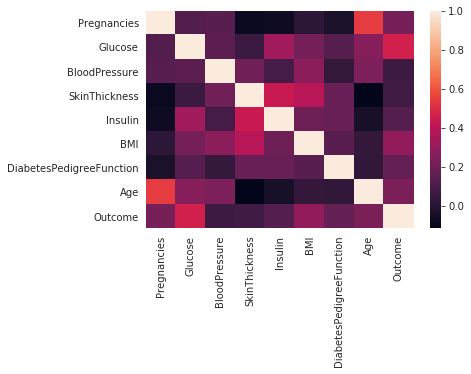

In [4]:
corr = diabetesDF.corr()
print(corr)
sns.heatmap(corr,
         xticklabels=corr.columns,
         yticklabels=corr.columns)



### Define Keras Model

Models in Keras are defined as a sequence of layers.

We create a Sequential model and add layers one at a time until we are happy with our
network architecture.

The first thing to get right is to ensure the input layer has the right number of
input features. This can be specified when creating the first layer with the input_dim
 argument and setting it to 8 for the 8 input variables.

In this example, we will use a fully-connected network structure with three layers.

Fully connected layers are defined using the Dense class. We can specify the number
 of neurons or nodes in the layer as the first argument, and specify the activation
  function using the activation argument.

We will use the rectified linear unit activation function referred to as ReLU on
the first two layers and the Sigmoid function in the output layer.

We can piece it all together by adding each layer:

The model expects rows of data with 8 variables (the input_dim=8 argument)
The first hidden layer has 12 nodes and uses the relu activation function.
The second hidden layer has 8 nodes and uses the relu activation function.
The output layer has one node and uses the sigmoid activation function.

In [5]:
# model = Sequential()
# model.add(Dense(12, input_dim=8, activation='relu'))
# model.add(Dense(8, activation='relu'))
# model.add(Dense(1, activation='sigmoid'))

### Compile Keras Model

Now that the model is defined, we can compile it.

Compiling the model uses the efficient numerical libraries under the covers
(the so-called backend) such as Theano or TensorFlow. The backend automatically chooses the
best way to represent the network for training and making predictions to run on your hardware,
 such as CPU or GPU or even distributed.

When compiling, we must specify the loss function to use to evaluate a set of weights,
the optimizer is used to search through different weights for the network and any optional
metrics we would like to collect and report during training.

In this case, we will use cross entropy as the loss argument. This loss is for a
binary classification problems and is defined in Keras as “binary_crossentropy“.
We will define the optimizer as the efficient stochastic gradient descent algorithm “adam“.
Finally, because it is a classification problem, we will collect and report the
classification accuracy, defined via the metrics argument.

In [6]:
# model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

### Fit Keras Model

We have defined our model and compiled it ready for efficient computation.
We can train or fit our model on our loaded data by calling the fit() function on
the model.

Training occurs over epochs and each epoch is splited into batches.

Epoch: One pass through all the rows in the training dataset.
Batch: One or more samples considered by the model within an epoch before weights
are updated.

The training process will run for a fixed number of iterations through the dataset
called epochs, that we must specify using the epochs argument. We must also set the
number of dataset rows that are considered before the model weights are updated within
each epoch, called the batch size and set using the batch_size argument.

For this problem, we will run for a small number of epochs (150) and use a relatively
small batch size of 10.

In [7]:
# # train
# model.fit(X, y, epochs=150, batch_size=10)
#
# # evaluate
# score = model.evaluate(X, y, verbose=0)
# print('Test loss:', score[0])
# print('Test accuracy:', score[1])
#
# # save model and architecture to single file
# model.save("model.h5")
# print("Saved model to disk")

### Load model

In [4]:
# load model
model = load_model('model.h5')
# summarize model.
model.summary()
preds = model.predict(X) > 0.5
preds = preds.astype(int)

# evaluate
score = model.evaluate(X, y, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

/home/andrea/anaconda3/envs/xai/lib/python2.7/site-packages/keras/models.py:318: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 12)                108       
_________________________________________________________________
dense_5 (Dense)              (None, 8)                 104       
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 9         
Total params: 221
Trainable params: 221
Non-trainable params: 0
_________________________________________________________________
Test loss: 0.47332920134067535
Test accuracy: 0.7877604166666666


In [ ]:
real_y_of_0_preds = y[np.where(preds==0)[0]]
real_y_of_1_preds = y[np.where(preds==1)[0]]

In [9]:
data = []
index = []

attributions = dict()

n_1_class = np.count_nonzero(preds)
n_0_class = len(preds)-n_1_class
n_explanations = X.shape[0]

eX_1_lrp = np.zeros((n_1_class,8))
eX_0_lrp = np.zeros((n_0_class,8))
eX_1_ig = np.zeros((n_1_class,8))
eX_0_ig = np.zeros((n_0_class,8))


method_attribution_dict = {'ig_1': ("ig_attributtions_1.txt", eX_1_ig),
                                      'lrp_1': ('lrp_attributions_1.txt', eX_1_lrp),
                                      'ig_0': ("ig_attributtions_0.txt", eX_0_ig),
                                      'lrp_0': ('lrp_attributions_0.txt', eX_0_lrp)}

In [10]:
# # Statistics
# times_lrp = np.ndarray((n_explanations,))
# times_ig = np.ndarray((n_explanations,))
#
# # Counters of explanations per class
# j_0 = 0
# j_1 = 0
#
# for i in range(n_explanations):
#
#     # input to explain
#     xs = X[[i]]
#
#     # For dividing explanations for SpRAy
#     x_class = preds[i]
#
#     # Explanations
#     with DeepExplain(session=K.get_session()) as de:
#
#         # Need to reconstruct the graph in DeepExplain context, using the same weights.
#         # With Keras this is very easy:
#         # 1. Get the input tensor to the original model
#         input_tensor = model.layers[0].input
#
#         # 2. We now target the output of the last dense layer (pre-softmax)
#         # To do so, create a new model sharing the same layers untill the last dense (index -2)
#         fModel = Model(inputs=input_tensor, outputs = model.layers[-2].output)
#         target_tensor = fModel(input_tensor)
#
#         # method 1
#
#         # parameters
#         arg = 100
#         method_name = 'IG'
#
#         # explanations
#         begin = time.time()
#         explanation = de.explain('intgrad', target_tensor, input_tensor, xs, steps=arg)
#         time.sleep(1)
#         end = time.time()
#
#         # records
#         attributions[method_name] = explanation
#         times_ig[i] = end - begin
#
#         if x_class == 0:
#             eX_0_ig[j_0] = explanation
#         else:
#             eX_1_ig[j_1] = explanation
#
#
#         # method 2
#
#         # parameters
#         arg = 0.0001
#         method_name = 'LRP'
#
#         # explanation
#         begin = time.time()
#         explanation = de.explain('elrp', target_tensor, input_tensor, xs, epsilon=arg)
#         time.sleep(1)
#         end = time.time()
#
#         # record
#         if x_class == 0:
#             eX_0_lrp[j_0] = explanation
#             j_0 += 1
#         else:
#             eX_1_lrp[j_1] = explanation
#             j_1 += 1
#
#         attributions[method_name] = explanation
#         times_lrp[i] = end - begin

Save explanations and report running time

In [11]:
# method_name = 'IG'
# method_dict = {"Mean time": times_ig.mean()}
# data.append(method_dict)
# index.append(method_name)
#
# method_name = 'LRP'
# method_dict = {"Mean time": times_lrp.mean()}
# data.append(method_dict)
# index.append(method_name)
#
# time_table = pd.DataFrame(data, index=index)
# print(time_table)
#
# for (filename, mat) in method_attribution_dict.values():
#     mat = np.matrix(mat)
#     with open(filename,'wb') as f:
#         for line in mat:
#             np.savetxt(f, line, fmt='%.2f')
#


Show some examples of explanations

In [12]:
# labels = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
#            'BMI', 'DiabetesPedigreeFunction', 'Age']
# colors = ["blue", "pink", "red", "yellow", "green", "brown", "teal", "goldenrod"]
#
# fig     = plt.figure(figsize = (15, 15))
# rows    = 1
# columns = len(attributions)
#
# for i, method in enumerate(attributions.keys()):
#
#     ax1 = fig.add_subplot(rows, columns, i+1)
#     ax1.set_title(method)
#     ax1.set_xlabel("Input features")
#     ax1.set_ylabel("Attributions")
#     plt.setp(ax1.get_xticklabels(), rotation=45, ha="right",
#          rotation_mode="anchor")
#     barlist = plt.bar(labels, attributions[method].reshape(-1,), color ='black', width = 0.4)
#     for j in range(len(labels)):
#         barlist[j].set_color(colors[j])
#
# plt.show()

### Spectral relevance analysis (SpRAy)

Explanation techniques enable inspection of the decision process on a single instance
basis. SpRAy offers an alternative to efficiently investigate classifier behavior on large datasets, instead of
screening through many individual explanations.
SpRAy applies (spectral) clustering on a dataset of explanations in order to identify typical, as well as
atypical decision behaviors/prediction strategies of the model, and presents them to the user in a
concise and interpretable manner.

It consists of the next steps:

- Step 1: Computation of the explanations for the samples of interest.

- Step 2: Downsizing/normalizing of the explanations, and make them uniform in shape and size.

- Step 3: Cluster analysis on the explanations.A clustering algorithm is applied to the normalized
  explanation.

  For example, in eigengap analysis, the eigenvalue spectrum of spectral cluster encodes information about the cluster structure of
  the relevance maps. A strong increase in the difference between two successive eigenvalues (eigengap) indicates
  well-separated clusters, including atypical classification strategies. The few detected clusters are then presented to
  the user for inspection.


  **Alternately, the clustering step can be replaced by a low-dimensional embedding step to produce a visual map of the
  overall decision structure of the ML model.**

- Step 4: Identification of interesting clusters. Examples with the same cluster index can be understood as being
 associated with some prototypical decision strategy.


- Step 5 (Optional): Visualization by t-stochastic neighborhood embedding (t-SNE). This last step is not part of the
  analysis strictly speaking, but it's usefull to visualize how SpRAy works.


### SpRAy (with k-means)

### Load explanations

Besides explanations made by LRP and IG, we load explanations of LIME computed in other notebook.

In [13]:
method_attribution_dict = {'ig_1': ("ig_attributtions_1.txt", 0),
                                      'lrp_1': ('lrp_attributions_1.txt', 0),
                                      'ig_0': ("ig_attributtions_0.txt", 0),
                                      'lrp_0': ('lrp_attributions_0.txt', 0),
                                      'lime_1': ("lime_attributtions_1.txt", 0),
                                      'lime_0': ('lime_attributtions_0.txt', 0)}

In [14]:
for method, (filename, mat) in method_attribution_dict.items():
    # Read attribution matrix of method
    mat = np.loadtxt(filename, dtype=float)
    print(filename + " dims = ", mat.shape)
    method_attribution_dict[method] = (filename, mat)


lrp_attributions_0.txt dims =  (483, 8)
lrp_attributions_1.txt dims =  (285, 8)
ig_attributtions_1.txt dims =  (285, 8)
ig_attributtions_0.txt dims =  (483, 8)
lime_attributtions_0.txt dims =  (483, 8)
lime_attributtions_1.txt dims =  (285, 8)


Normalize explanations

**Note that this above interpretations require that our input data is normalized. Without that, we can’t claim that
importance is proportional to weights.**

In [15]:
from sklearn import preprocessing

In [16]:
for method, (filename, mat) in method_attribution_dict.items():
    # Normalize attributions
    scaler = preprocessing.StandardScaler().fit(mat)
    method_attribution_dict[method] = (filename, scaler.transform(mat))


Selection of number of clusters by elbow criteria.



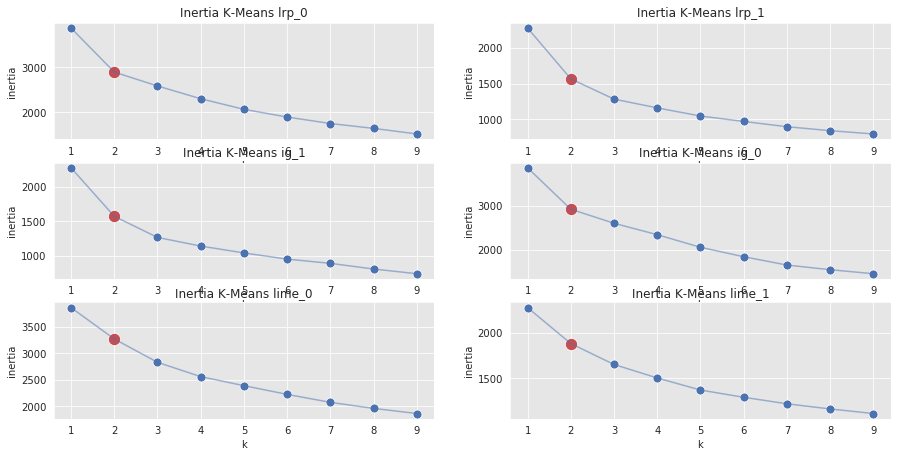

In [17]:
method_elbow_dict = dict()
method_elbow_dict['ig_1'] = 2
method_elbow_dict['ig_0'] = 2
method_elbow_dict['lrp_1'] = 2
method_elbow_dict['lrp_0'] = 2
method_elbow_dict['lime_1'] = 2
method_elbow_dict['lime_0'] = 2


fig     = plt.figure(figsize = (15, 15))
rows    = len(method_attribution_dict)
columns = 2
i = 0

for method, (filename, mat) in method_attribution_dict.items():

    # Calcule number of clusters using k-means

    inertias = []

    k_candidates = range(1, 10)

    for k in k_candidates:
        k_means = KMeans(random_state=42, n_clusters=k)
        k_means.fit(mat)
        inertias.append(k_means.inertia_)

    ax = fig.add_subplot(rows, columns, i+1)
    sns.scatterplot(x=k_candidates, y = inertias, s=80, ax=ax)
    e = method_elbow_dict[method] - 1
    sns.scatterplot(x=[k_candidates[e]], y = [inertias[e]], color=sns_c[3], s=150, ax=ax)
    sns.lineplot(x=k_candidates, y = inertias, alpha=0.5, ax=ax)
    ax.set(title='Inertia K-Means '+method, ylabel='inertia', xlabel='k')

    i += 1


### Visualization of explanations (PCA + k-means)

All the scatterplots show PCA projections of explanations onto firts two principal components.
The explanations in a scatterplot correspond only to one method and to one predicted class, e.g.
"ig_1" is the shorthand for explanations of Integrated gradient (IG), classified as members of class 1
by the model.

Scatterplots at left are colored by their true class, and the ones at right are colored by k-means
cluster.

Barplots below are examples of explanations grouped by cluster.


In [18]:
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context("notebook", font_scale=1.5,
                rc={"lines.linewidth": 2.5})




# Utility function to visualize the outputs with t-SNE or PCA

# In order to visualize the results of clustering algorithms, fashion_scatter()
# function takes two arguments: 1. x, which is a 2-D numpy array containing the output of the
# algorithm and 2. colors, which is 1-D numpy array containing the labels of the dataset. The function
# will render a scatter plot with as many unique colors as the number of classes in the variable colors.

# Utility function to visualize the outputs of PCA and t-SNE

def fashion_scatter(x, colors, method):
    # choose a color palette with seaborn.
    num_classes = len(np.unique(colors))
    palette = np.array(sns.color_palette("hls", num_classes))

    # create a scatter plot.
    f = plt.figure(figsize=(6, 6))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(x[:,0], x[:,1], lw=0, s=40, c=palette[colors.astype(np.int)])
    plt.title(method)

    # add the labels for each digit corresponding to the label
    txts = []

    for i in range(num_classes):

        # Position of each label at median of data points.
        xtext, ytext = np.median(x[colors == i, :], axis=0)
        txt = ax.text(xtext, ytext, str(i), fontsize=24)
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=5, foreground="w"),
            PathEffects.Normal()])
        txts.append(txt)

    return f, ax, sc, txts

def get_pca_proj(mat):
    """Return PCA projection and prints a report of de explained variance"""
    pca = PCA(n_components=4)
    pca_result = pca.fit_transform(mat)
    pca_df = pd.DataFrame(columns = ['pca1','pca2','pca3','pca4'])

    pca_df['pca1'] = pca_result[:,0]
    pca_df['pca2'] = pca_result[:,1]
    pca_df['pca3'] = pca_result[:,2]
    pca_df['pca4'] = pca_result[:,3]

    print('Variance explained per principal component: {}'.format(pca.explained_variance_ratio_))

    top_two_comp = pca_df[['pca1','pca2']]

    return top_two_comp.values

def cluster_by_kmeans(mat, n_clusters):
    # Clustering
    data_df = pd.DataFrame(mat)
    k_means = KMeans(random_state=RANDOM_SEED, n_clusters=n_clusters)
    k_means.fit(data_df)
    clusters = np.array(k_means.predict(data_df))
    return clusters

In [19]:
def add_colored_scatter_plot_to_fig(x, y, colors, rows, columns, n_sub_fig, fig, title):
    ax = fig.add_subplot(rows, columns, n_sub_fig)
    ax.set_title(title)
    sns.scatterplot(x=x, y = y, c=colors, s=80, ax=ax)

def clusters_to_colors(clusters):
    # choose a color palette with seaborn.
    num_classes = len(np.unique(clusters))
    palette = np.array(sns.color_palette("hls", num_classes))
    return palette[clusters.astype(np.int)]

labels = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
               'BMI', 'DiabetesPedigreeFunction', 'Age']
bar_colors = ["blue", "pink", "red", "yellow", "green", "brown", "teal", "goldenrod"]

def visualize_some_explanations_by_cluster(method_class, exp, clusters):
    """ for each method -restricted to one prediction class-
    and for each cluster in that method-prediction-class
    a sample of explanations are presented """
    colors = clusters_to_colors(clusters)

    for i in range(len(np.unique(clusters))):

        # get explanations in cluster of interest
        idx_interest = np.where(clusters==i)[0]
        explanations_in_cluster = exp[idx_interest,:]
        colors_of_interest = colors[idx_interest]

        # select number of explanations to visualize
        n_exp_clus = explanations_in_cluster.shape[0]
        n_explanations = min(n_exp_clus, 10)

        # select sample of explanations to visualize
        idx_interest = np.random.choice(n_exp_clus, n_explanations, replace=False)
        explanations_to_visualize = explanations_in_cluster[idx_interest,:]
        colors_to_visualize = colors_of_interest[idx_interest]

        # Visualization
        rows = n_explanations/2 + 1
        columns = 2
        fig  = plt.figure(figsize = (20, 20))
        title_obj = plt.title(method_class+": examples of explanations in cluster "+str(i))
        plt.setp(title_obj, color=colors_to_visualize[0])

        for j in range(n_explanations):
            ax1 = fig.add_subplot(rows, columns, j+1)
            ax1.set_xlabel("Input features")
            ax1.set_ylabel("Attributions")
            plt.setp(ax1.get_xticklabels(), rotation=15, ha="right",
                 rotation_mode="anchor", fontsize=10)
            barlist = plt.bar(labels, explanations_to_visualize[j].reshape(-1,), color ='black', width = 0.4)
            for k in range(len(labels)):
                barlist[k].set_color(bar_colors[k])
    plt.show()


Variance explained per principal component: [0.32572885 0.18512834 0.13463947 0.11977723]


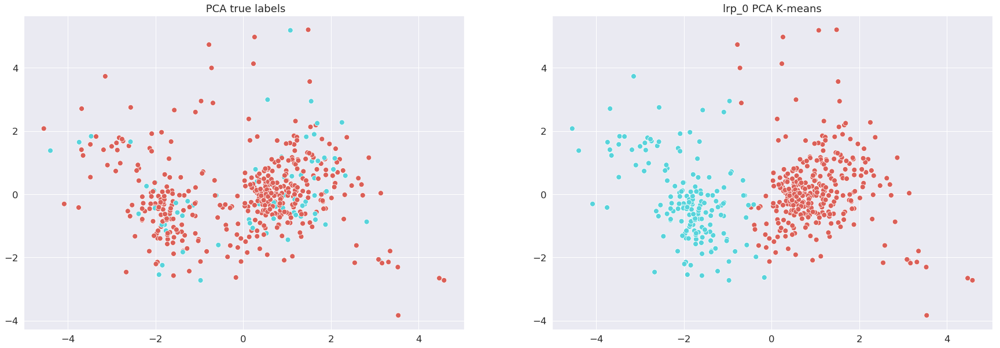

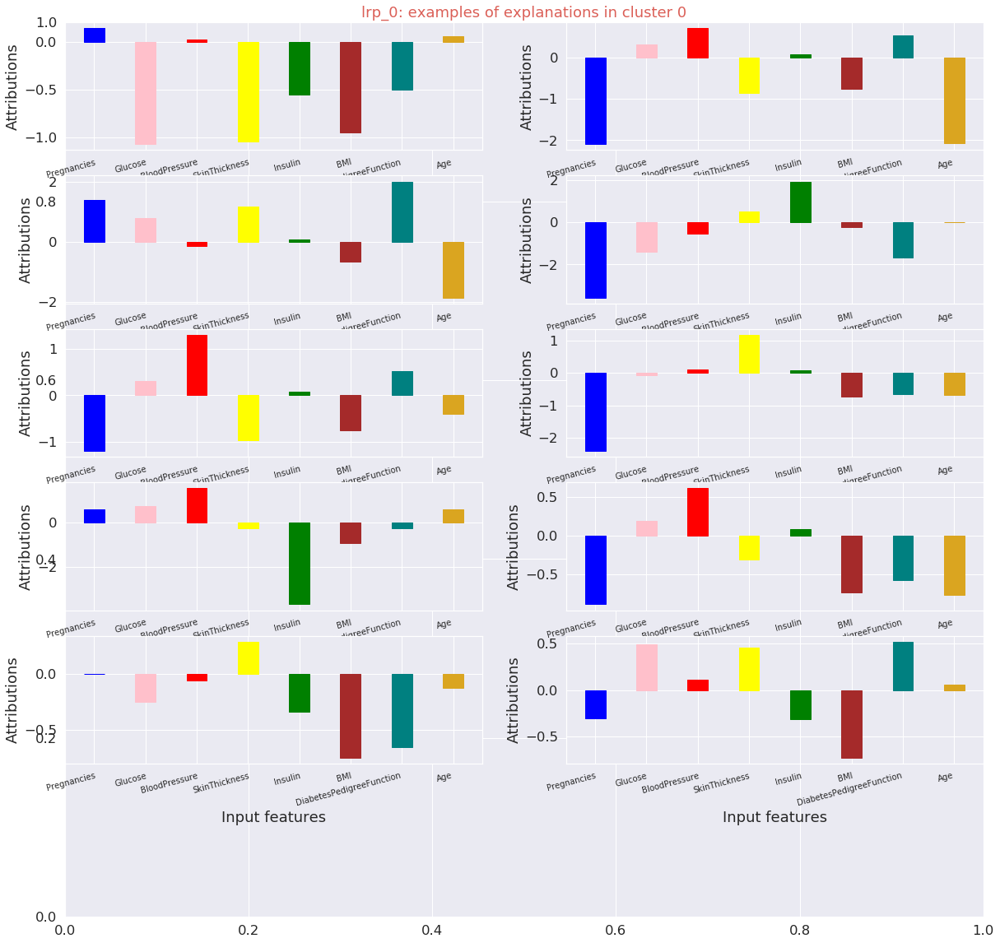

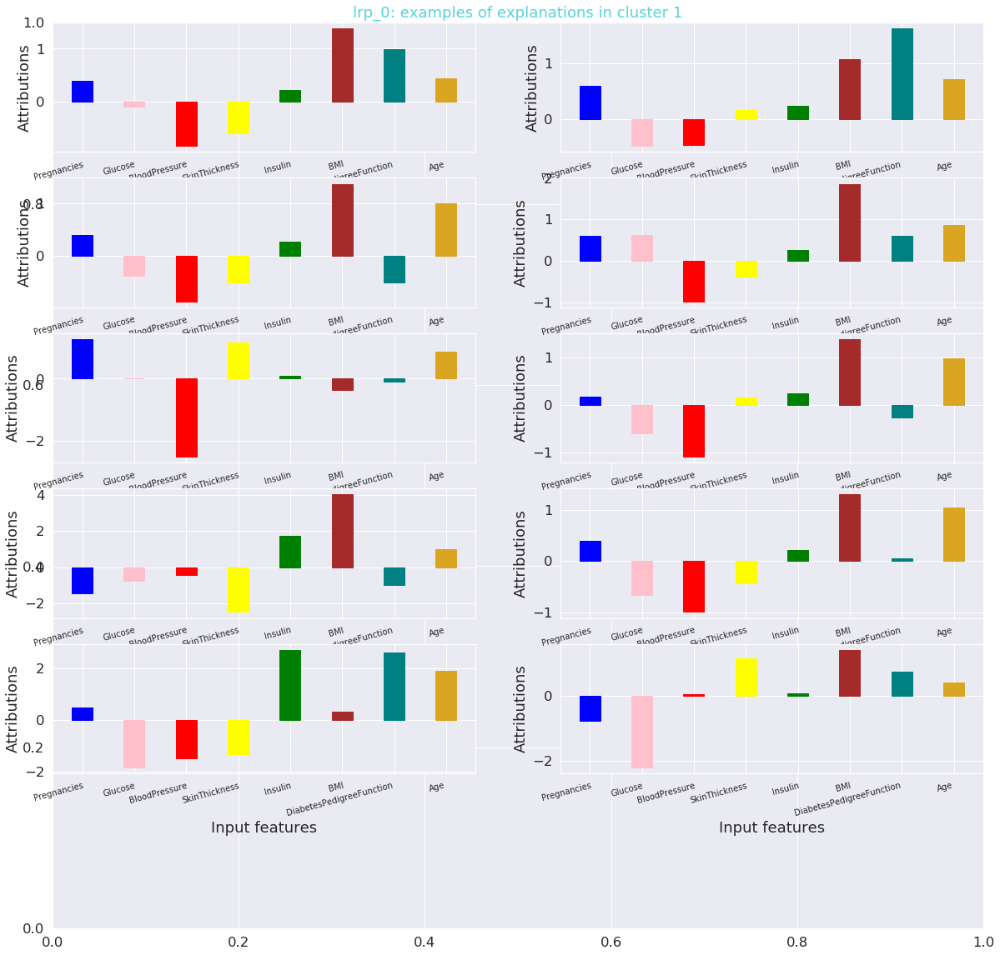

Variance explained per principal component: [0.39992615 0.20609266 0.10602239 0.09464125]


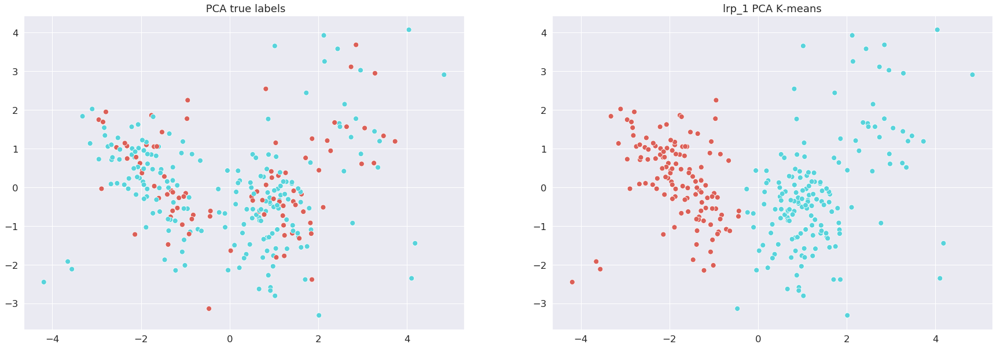

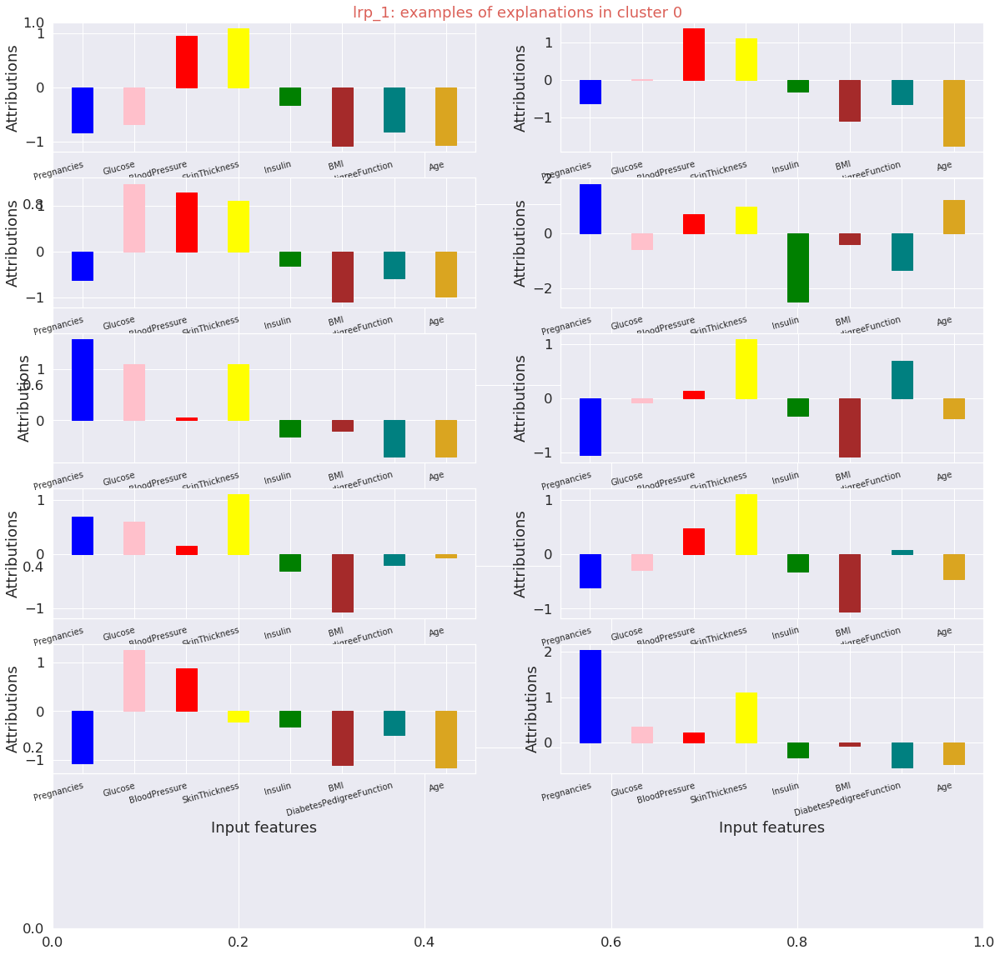

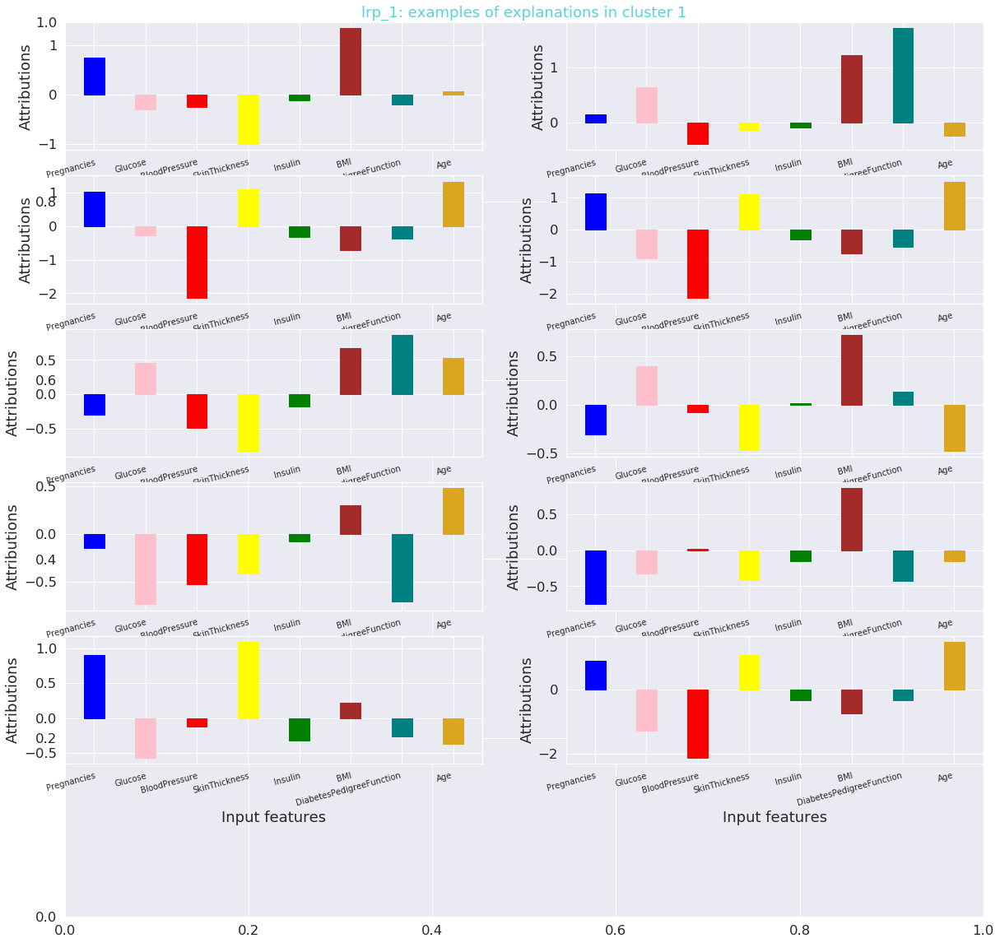

Variance explained per principal component: [0.39239078 0.20111021 0.11476181 0.08650106]


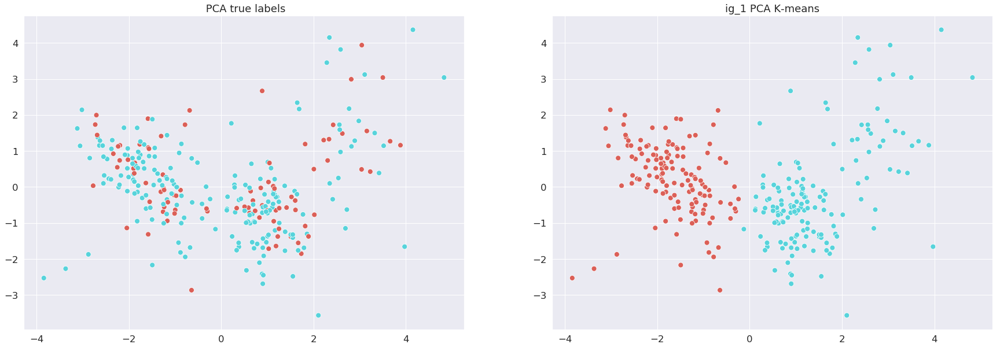

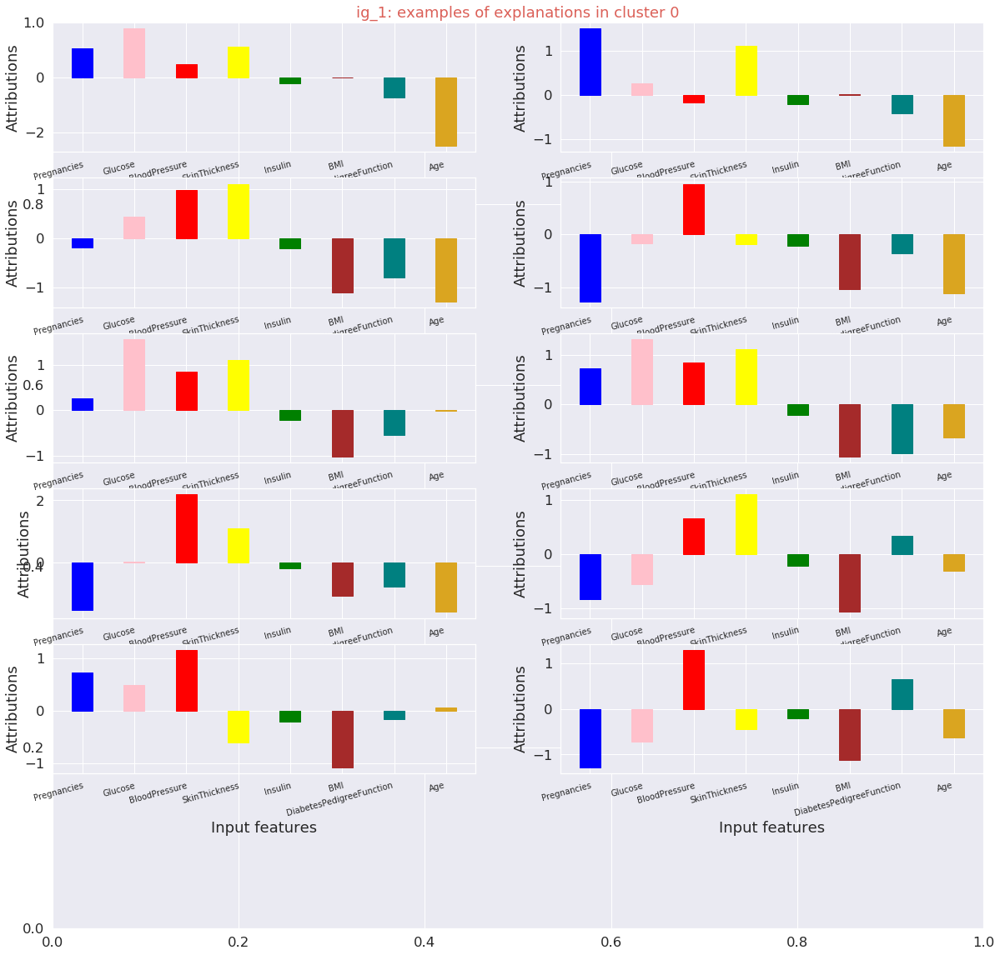

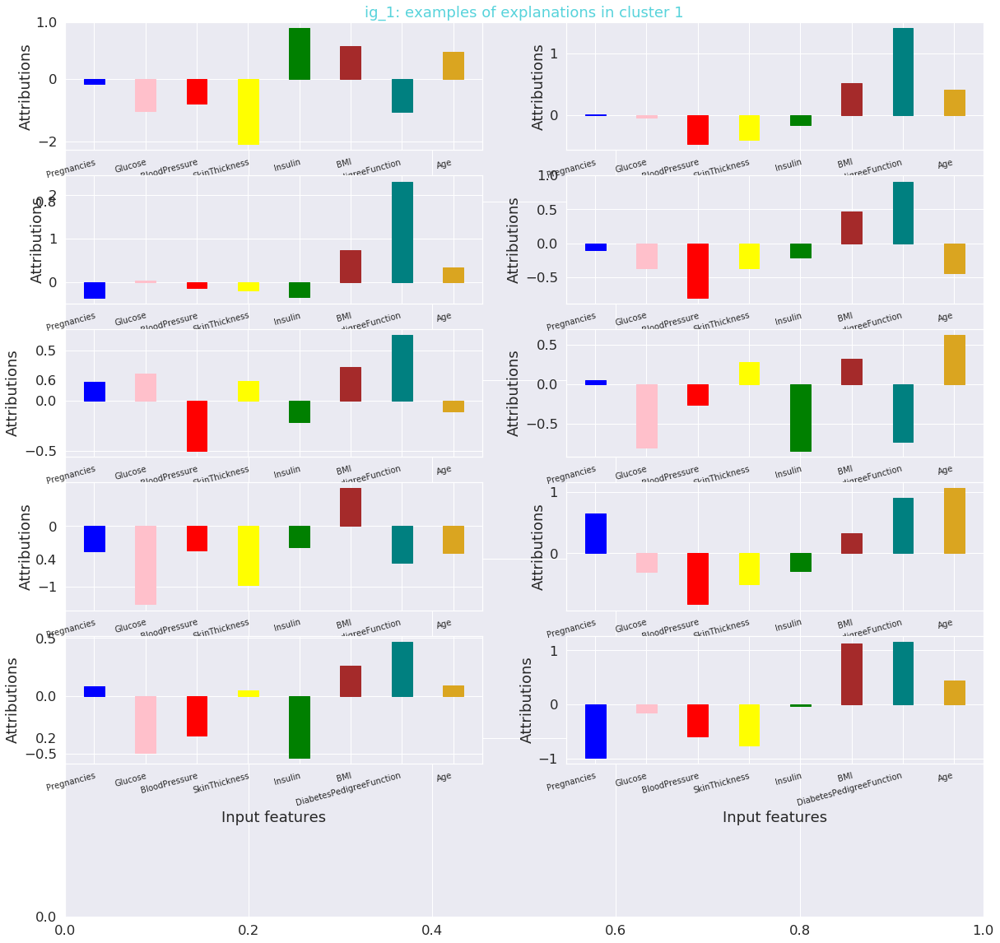

Variance explained per principal component: [0.31496133 0.18395365 0.15474831 0.12116025]


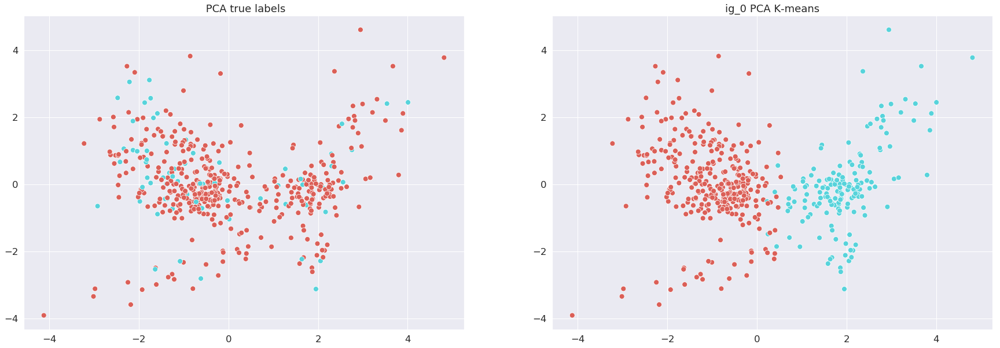

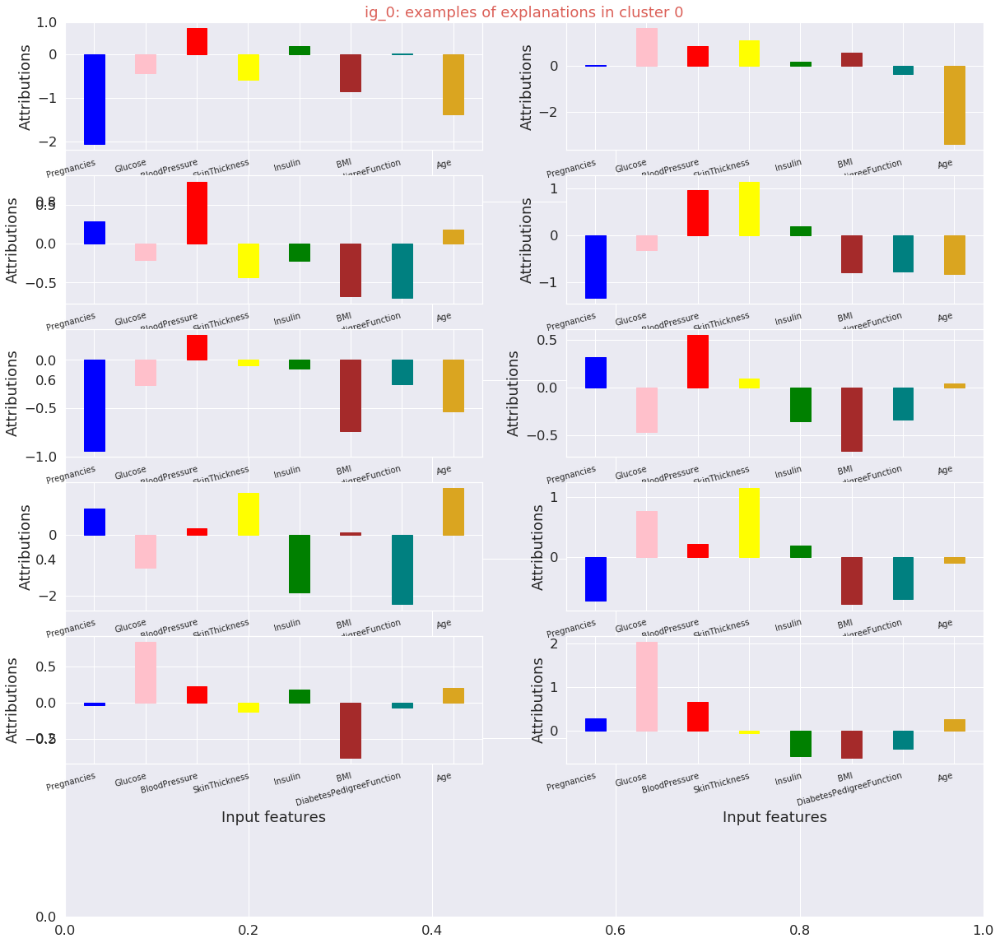

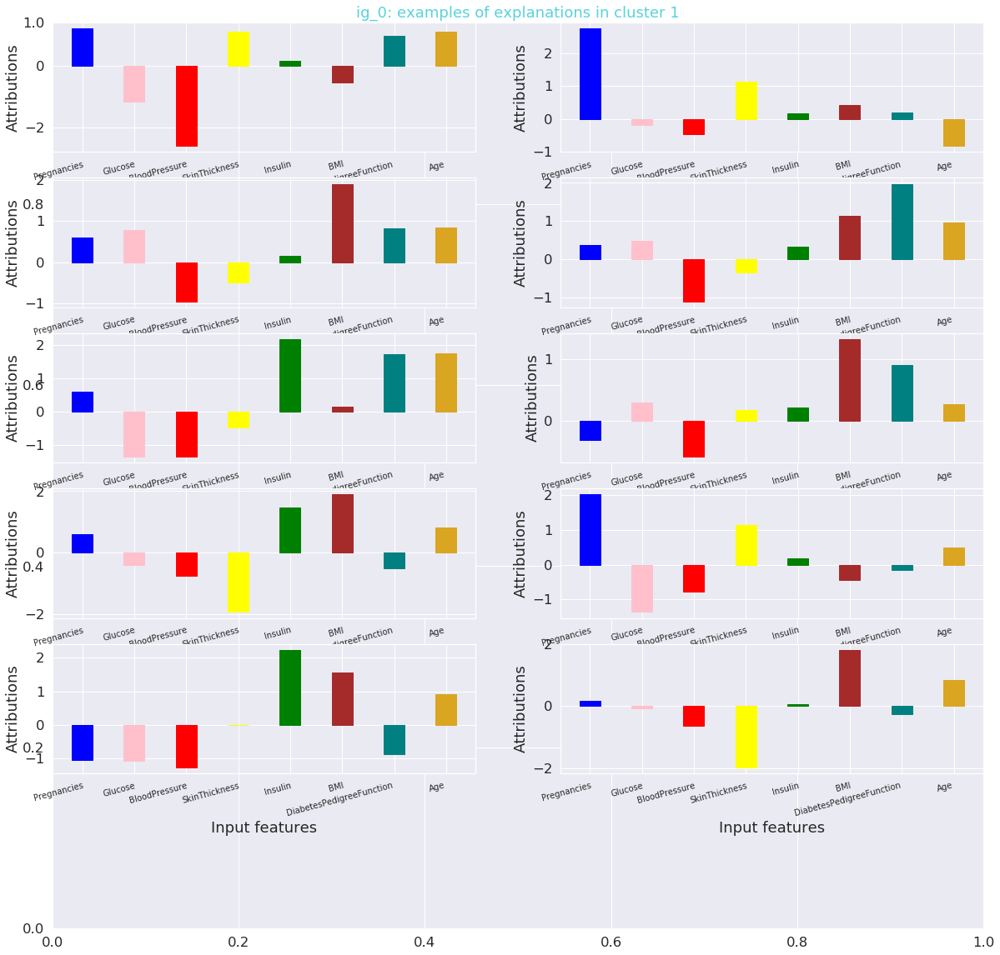

Variance explained per principal component: [0.21156873 0.20484737 0.1540293  0.12634996]


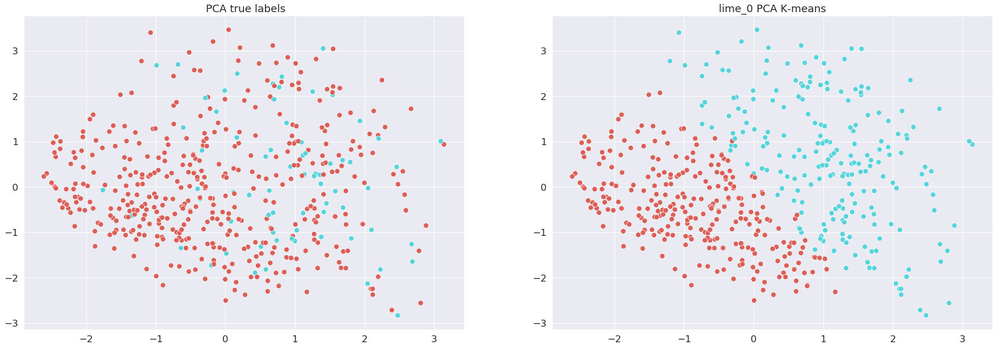

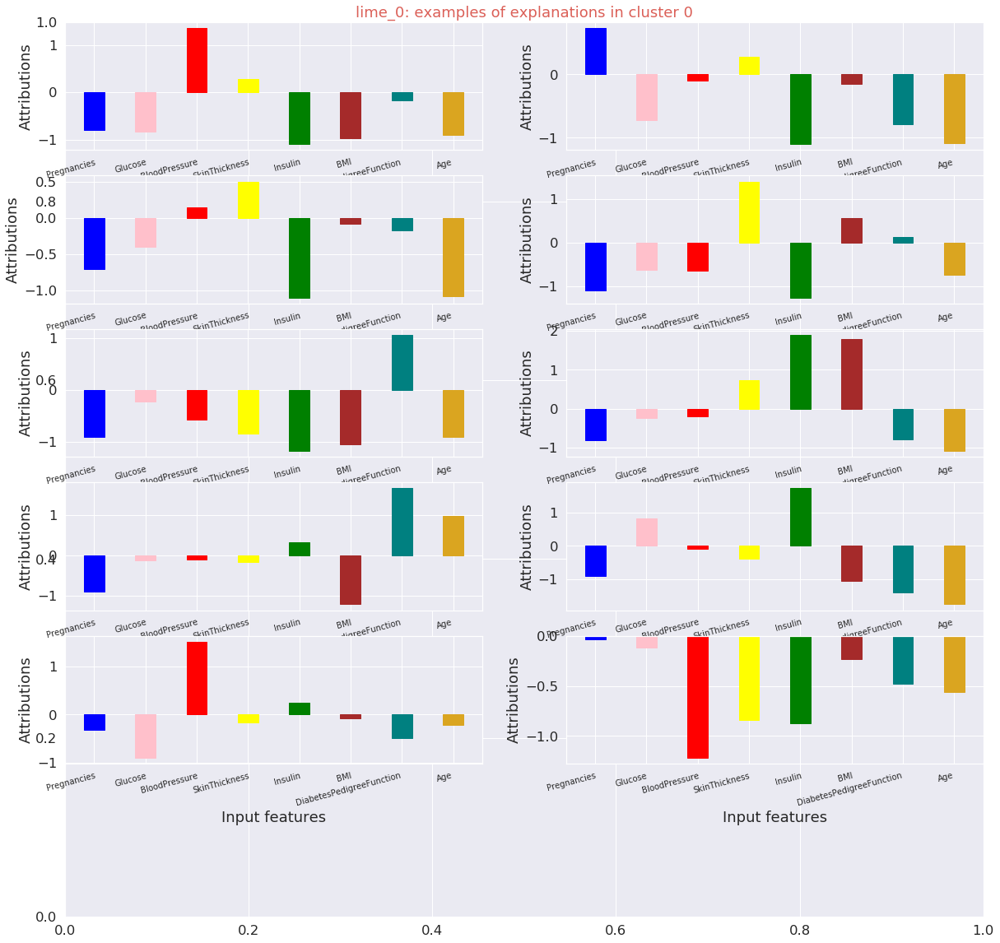

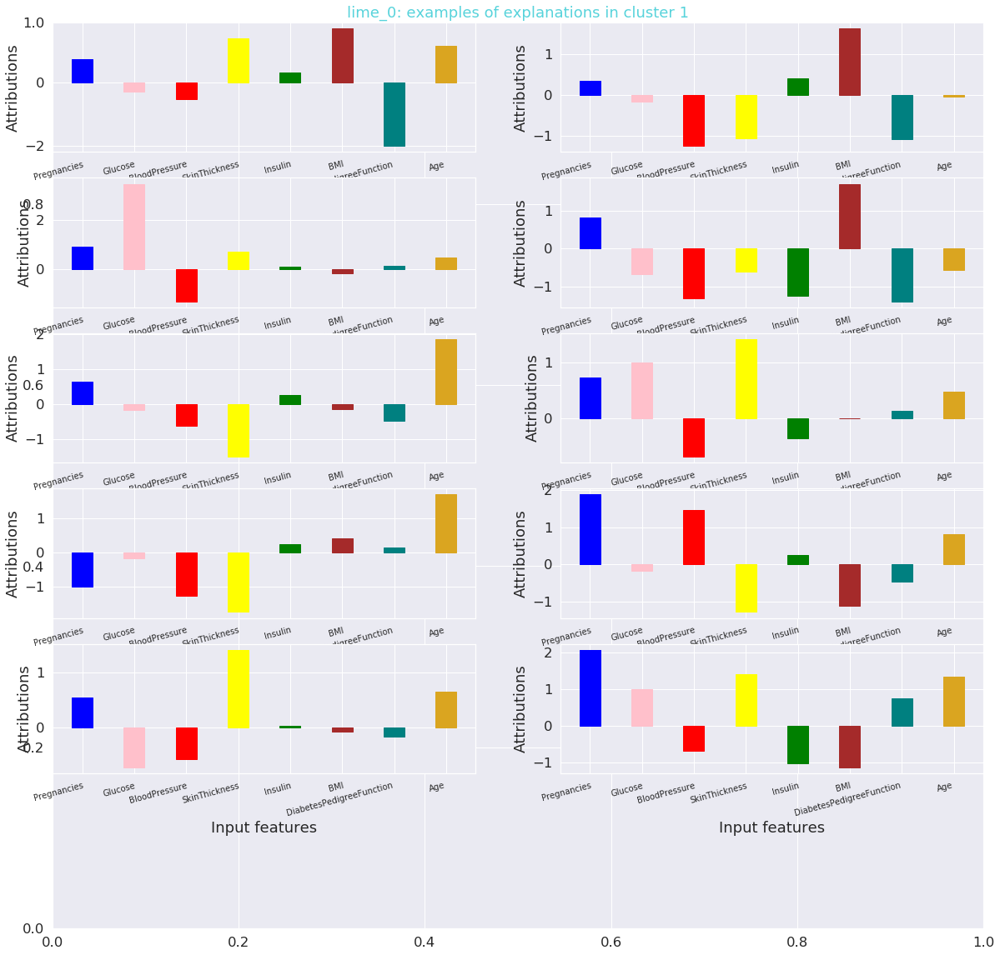

Variance explained per principal component: [0.22821921 0.19656623 0.1491484  0.13211303]


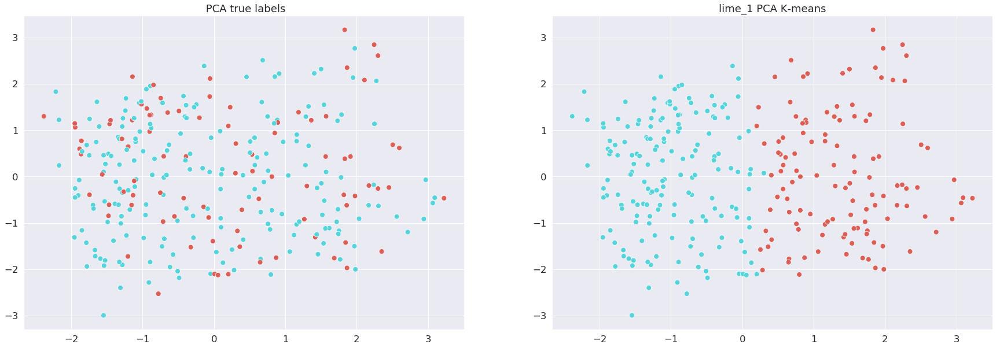

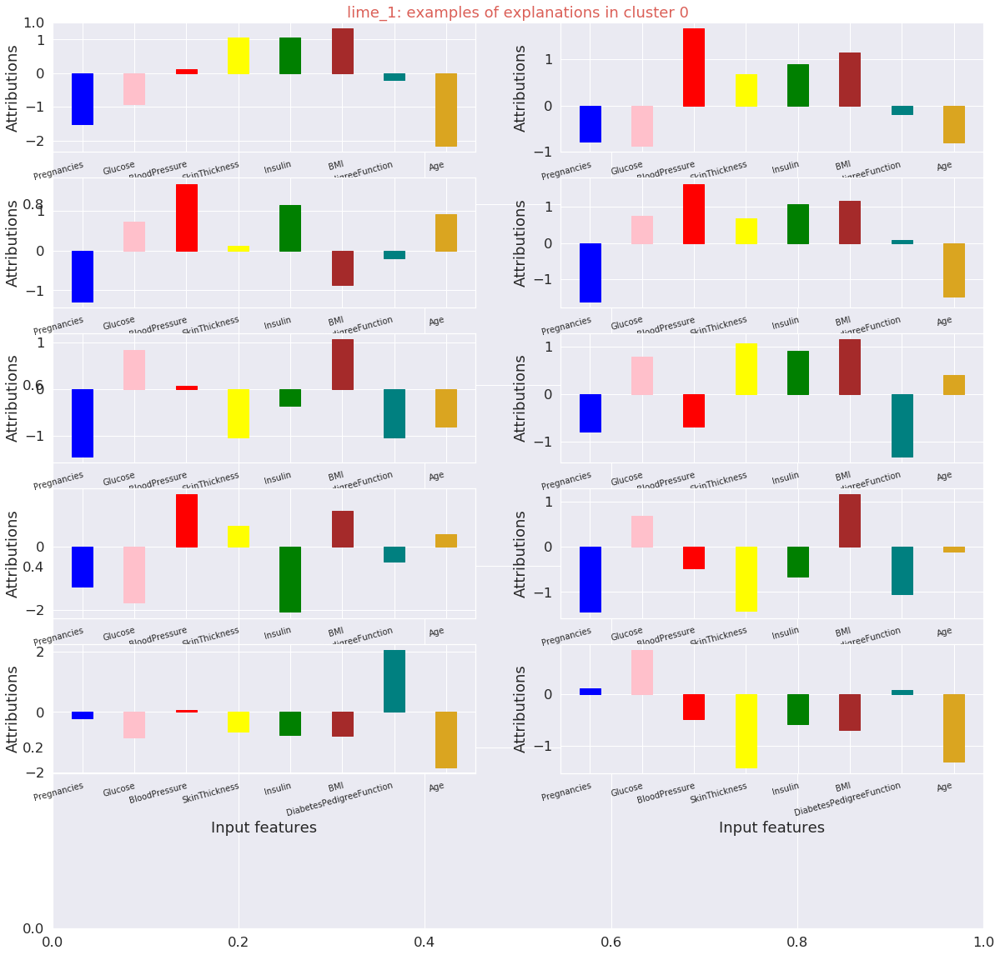

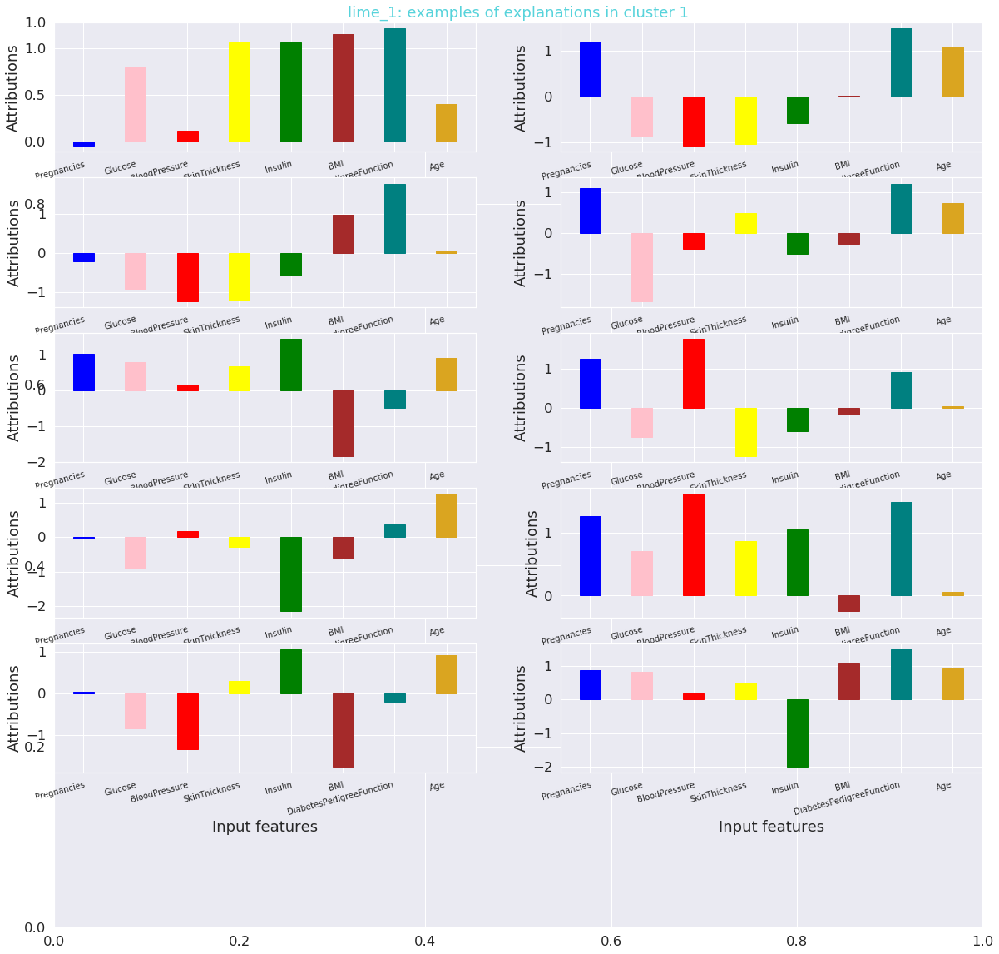

In [20]:
for method, (filename, mat) in method_attribution_dict.items():

    rows = 1
    cols = 2
    fig  = plt.figure(figsize = (30, 10))

    proy = get_pca_proj(mat)

    if method[-1] == str(0): clusters = real_y_of_0_preds
    else:
        clusters = real_y_of_1_preds

    colors = clusters_to_colors(clusters)


    add_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, 1, fig,
                                    " PCA true labels")
    # Clustering
    clusters = cluster_by_kmeans(mat, method_elbow_dict[method])

    # Clustering visualization
    colors = clusters_to_colors(clusters)
    add_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, 2, fig,
                                    method+" PCA K-means")

    visualize_some_explanations_by_cluster(method, mat, clusters)



#### SpRAy with Spectral Clustering (SC)

In [21]:
def generate_graph_laplacian(df, nn):
    """Generate graph Laplacian from data."""
    # Adjacency Matrix.
    connectivity = kneighbors_graph(X=df, n_neighbors=nn, mode='connectivity')
    adjacency_matrix_s = (1/2)*(connectivity + connectivity.T)
    # Graph Laplacian.
    graph_laplacian_s = sparse.csgraph.laplacian(csgraph=adjacency_matrix_s, normed=False)
    graph_laplacian = graph_laplacian_s.toarray()
    return graph_laplacian

def compute_spectrum_graph_laplacian(graph_laplacian):
    """Compute eigenvalues and eigenvectors and project
    them onto the real numbers.
    """
    eigenvals, eigenvcts = linalg.eig(graph_laplacian)

    # Verify eigenvalues are real
    print("Imaginary values ", np.unique(np.imag(eigenvals)))

    eigenvals = np.real(eigenvals)
    eigenvcts = np.real(eigenvcts)
    return eigenvals, eigenvcts

def project_and_transpose(eigenvals, eigenvcts, num_ev):
    """Select the eigenvectors corresponding to the first
    (sorted) num_ev eigenvalues as columns in a data frame.
    """
    eigenvals_sorted_indices = np.argsort(eigenvals)
    indices = eigenvals_sorted_indices[: num_ev]

    proj_df = pd.DataFrame(eigenvcts[:, indices.squeeze()])
    proj_df.columns = ['v_' + str(c) for c in proj_df.columns]
    return proj_df

def run_k_means(df, n_clusters):
    """K-means clustering."""
    k_means = KMeans(random_state=25, n_clusters=n_clusters)
    k_means.fit(df)
    cluster = k_means.predict(df)
    return cluster


def clusters_by_spectral_clustering(mat, n_neighbors, n_clusters):
    """Spectral Clustering Algorithm."""
    df = pd.DataFrame(mat)
    graph_laplacian = generate_graph_laplacian(df, n_neighbors)
    eigenvals, eigenvcts = compute_spectrum_graph_laplacian(graph_laplacian)
    proj_df = project_and_transpose(eigenvals, eigenvcts, n_clusters)
    cluster = run_k_means(proj_df, proj_df.columns.size)

    return np.array(cluster)

First, we decide perplexity for T-SNE in each set of explanations (associated to LRP, LIME or IG and one predicted class),
and the number of clusters for Spectral Clustering.


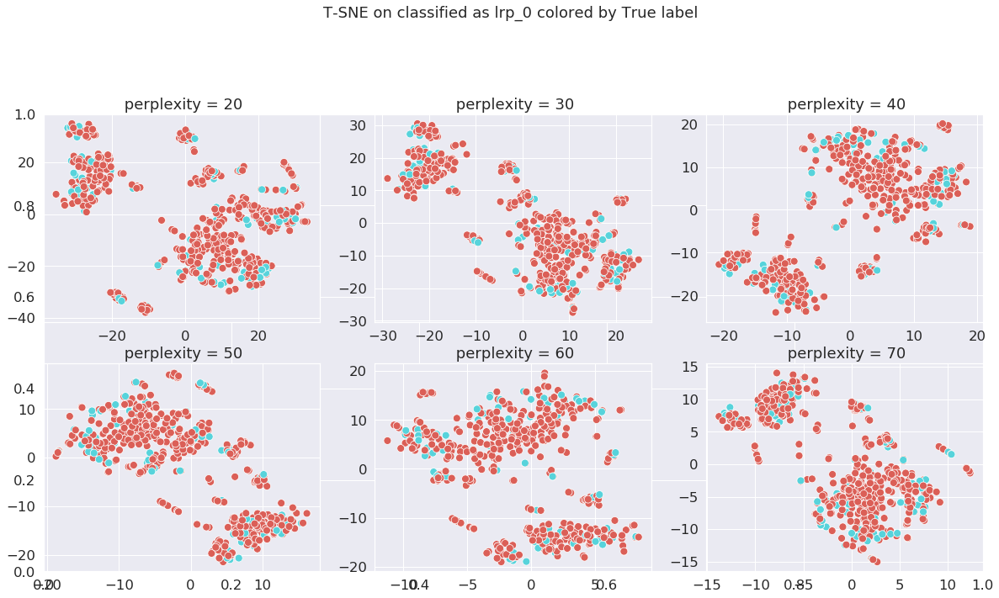

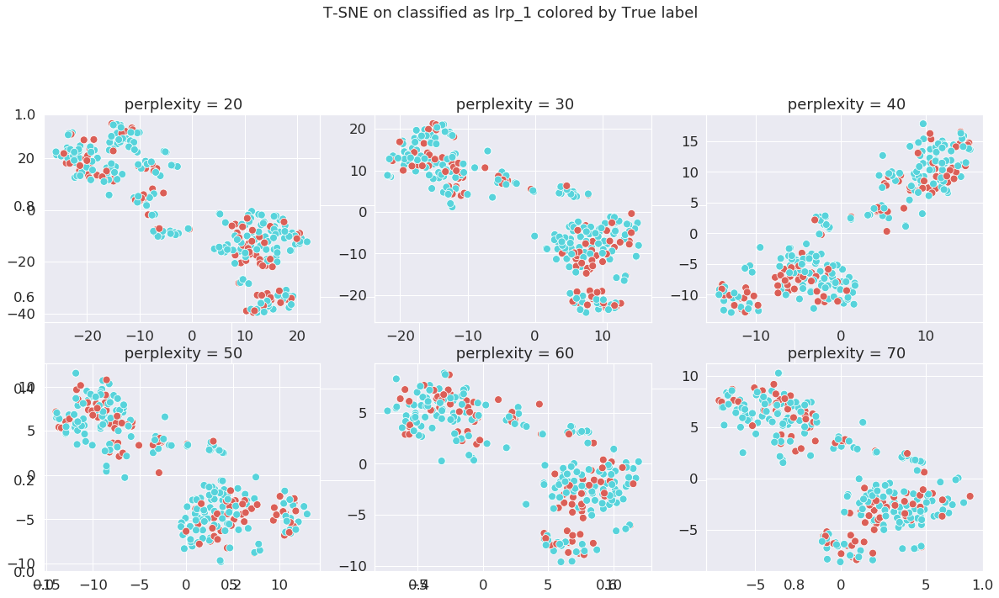

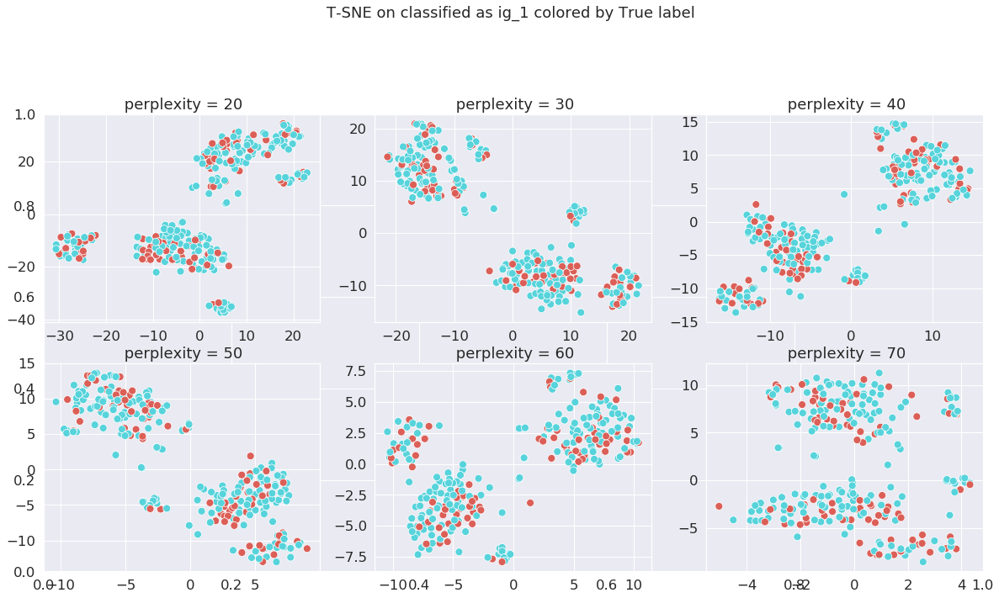

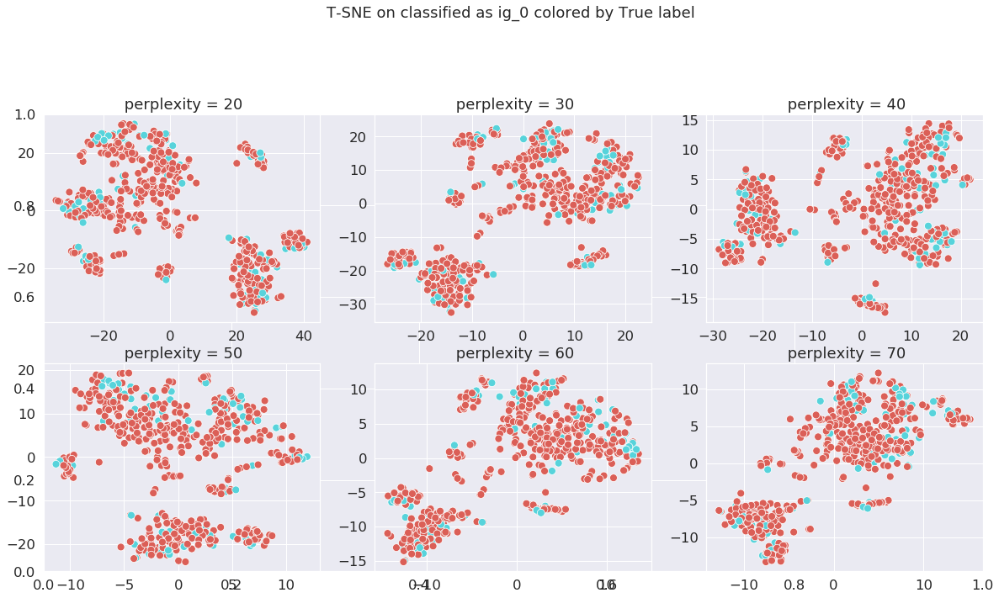

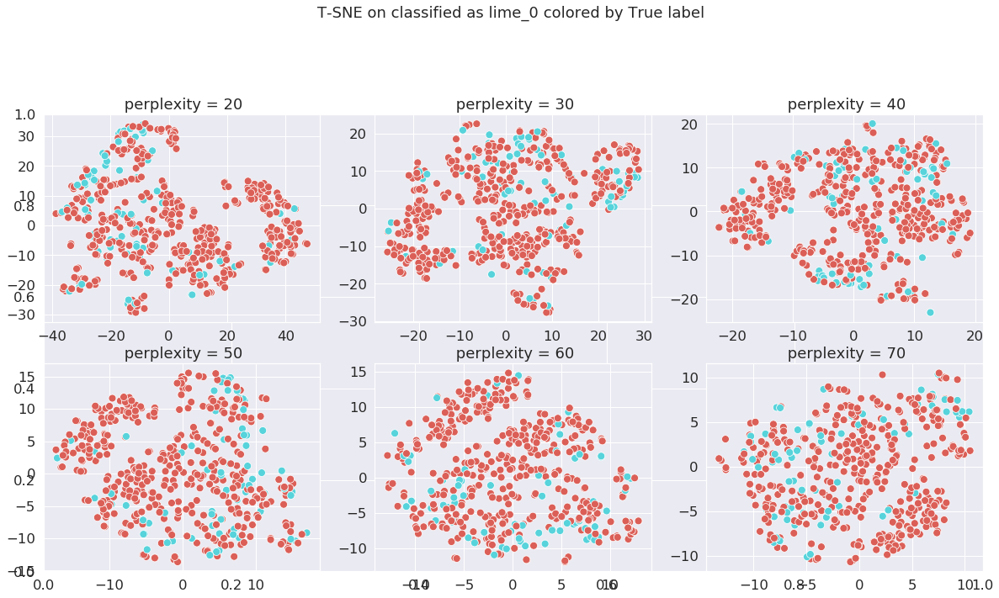

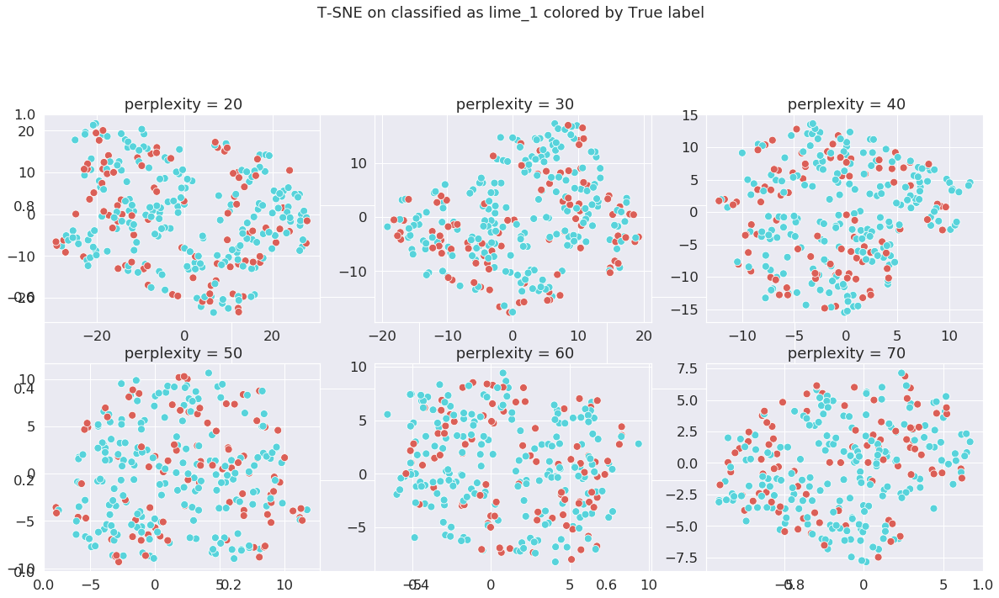

In [22]:

for method, (filename, mat) in method_attribution_dict.items():

    perplexitys = [20, 30, 40, 50, 60, 70]
    rows = 2
    columns = (len(perplexitys)+1)/2
    fig  = plt.figure(figsize = (20, 10))

    if method[-1] == str(0):
        clusters = real_y_of_0_preds
    else:
        clusters = real_y_of_1_preds

    colors = clusters_to_colors(clusters)
    plt.title("T-SNE on classified as "+str(method)+" colored by True label ", y=1.2)
    for k, perplexity in enumerate(perplexitys):
        proy = TSNE(random_state=RANDOM_SEED, perplexity=perplexity).fit_transform(mat)
        add_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, k+1, fig,
                                    " perplexity = "+str(perplexity))



In [23]:
method_class_perplexitys_clusters_dict = dict()

method_class_perplexitys_clusters_dict['lrp_0'] = (30, 2)
method_class_perplexitys_clusters_dict['lrp_1'] = (30, 2)

method_class_perplexitys_clusters_dict['ig_1'] = (20, 3)
method_class_perplexitys_clusters_dict['ig_0'] = (30, 2)

method_class_perplexitys_clusters_dict['lime_0'] = (50, 2)
method_class_perplexitys_clusters_dict['lime_1'] = (60, 2)


method_proy_attribution_labels = dict()
for method, (filename, mat) in method_attribution_dict.items():

    perplexity = method_class_perplexitys_clusters_dict[method][0]

    proy = TSNE(random_state=RANDOM_SEED, perplexity=perplexity).fit_transform(mat)

    if method[-1] == str(0): real_labels = real_y_of_0_preds
    else:
        real_labels = real_y_of_1_preds

    method_proy_attribution_labels[method] = (proy, mat, real_labels)

Election of number of neighbours for Laplacian graph.

Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]


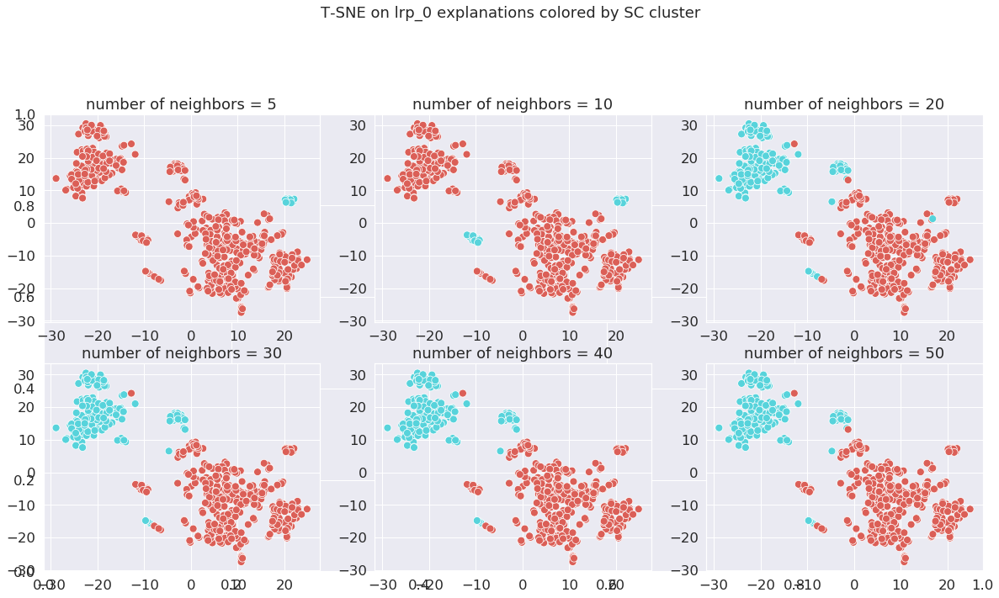

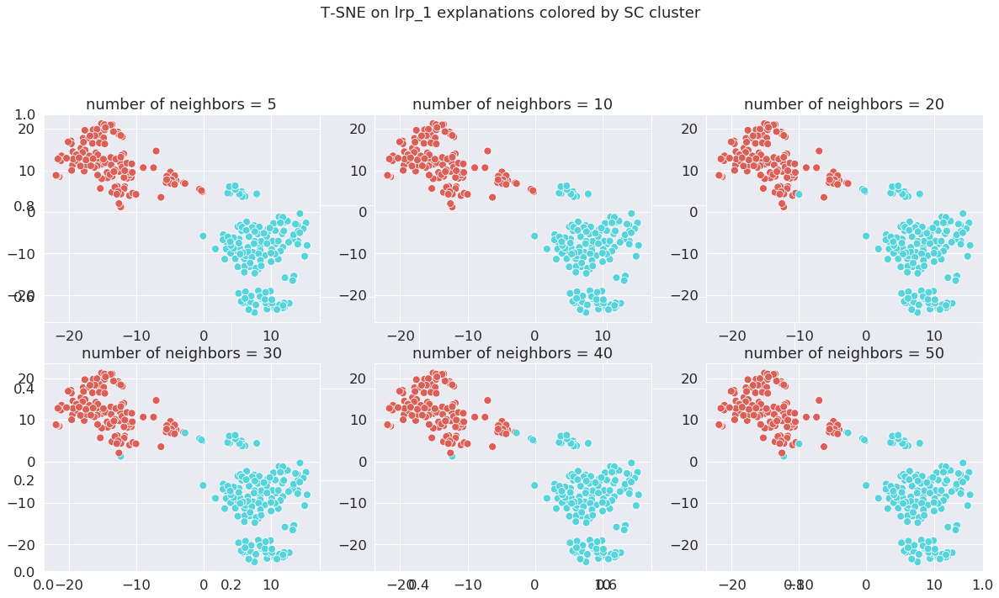

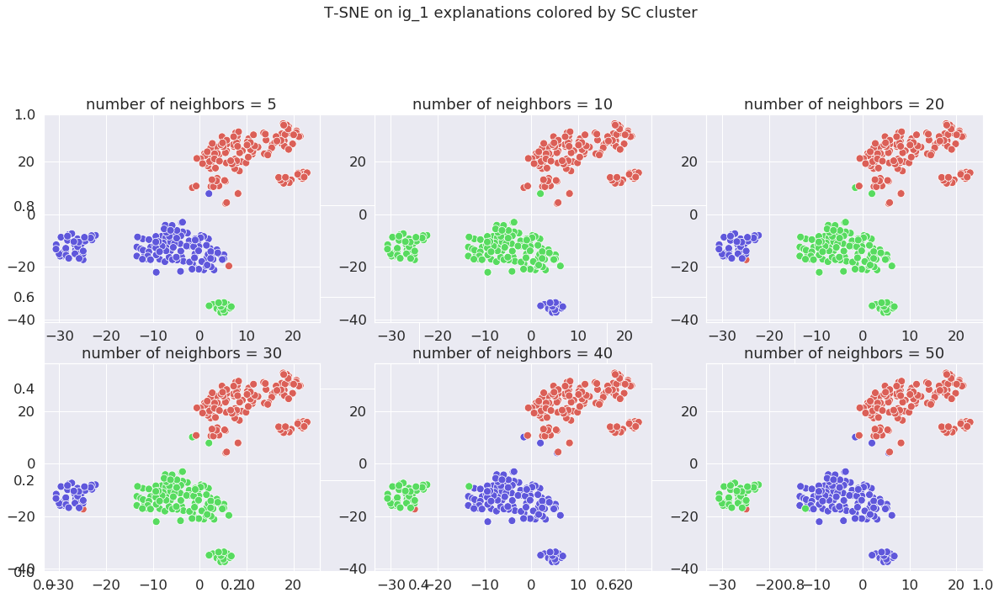

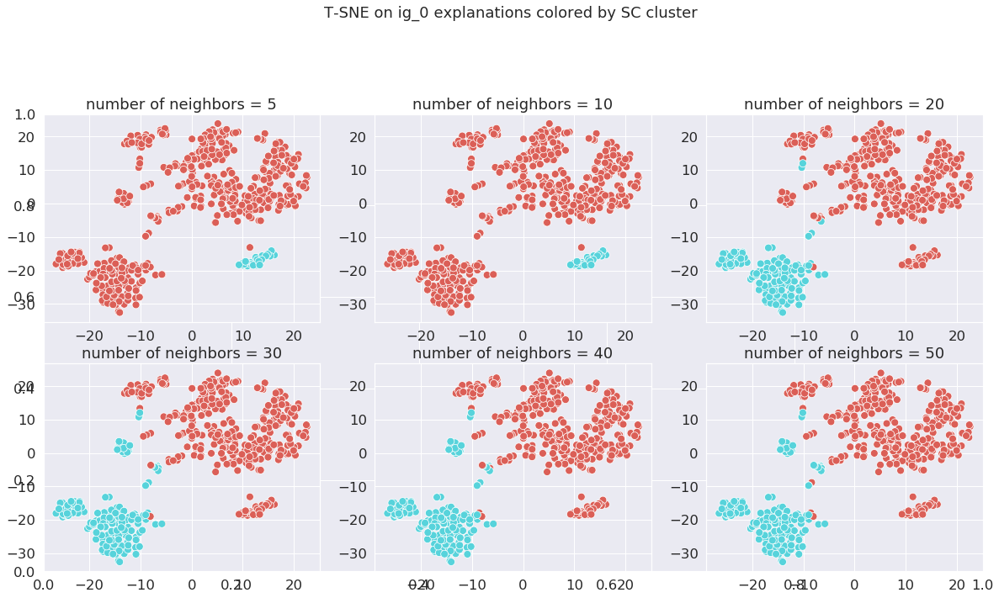

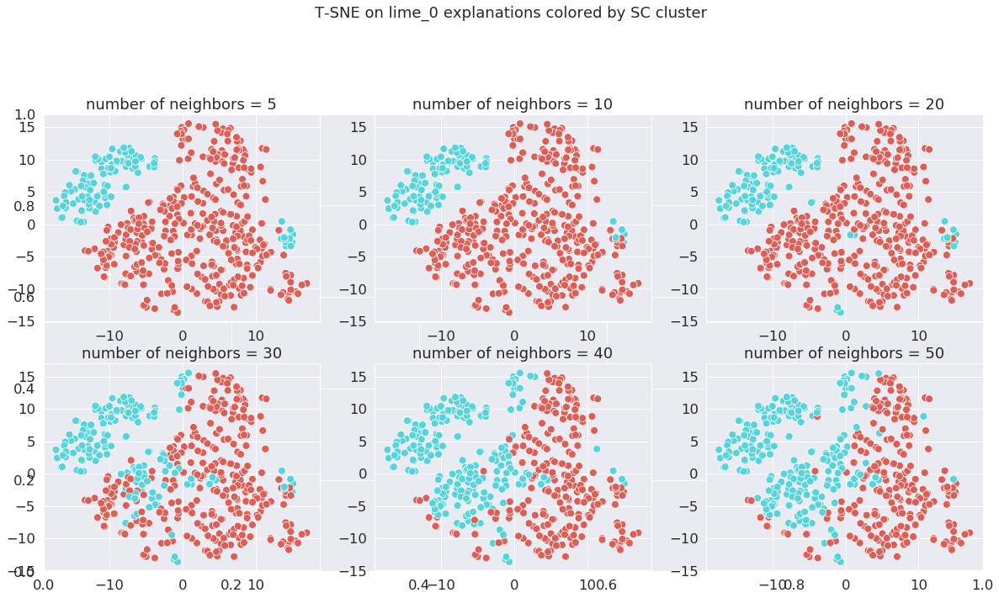

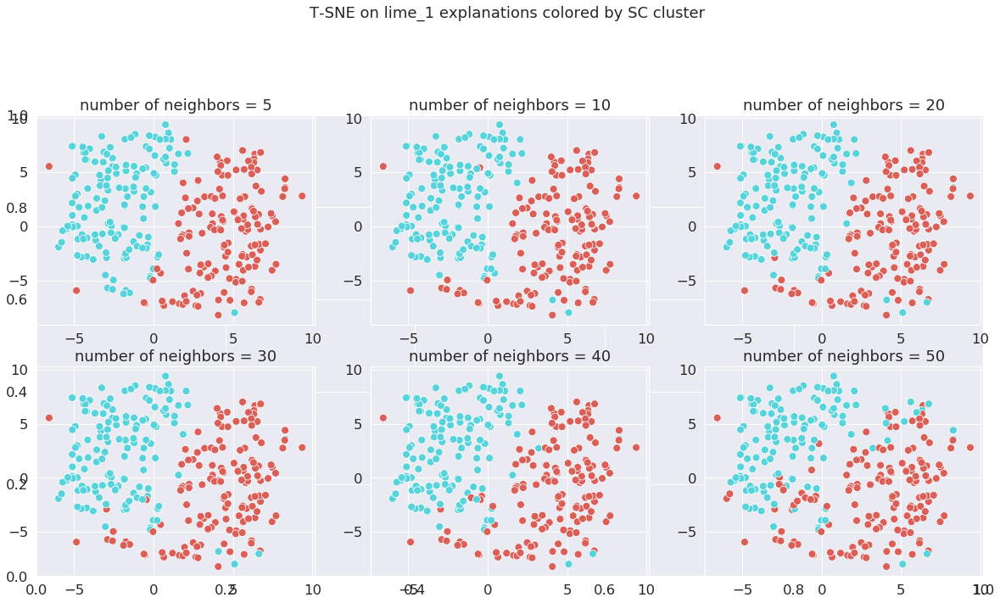

In [24]:
for method, (proy, mat, real_labels) in method_proy_attribution_labels.items():

    neighbors_opt = [5, 10, 20, 30, 40, 50]
    rows = 2
    columns = (len(neighbors_opt)+1)/2
    fig  = plt.figure(figsize = (20, 10))
    plt.title("T-SNE on "+str(method)+" explanations colored by SC cluster ", y=1.2)

    # Clustering
    n_clusters = method_class_perplexitys_clusters_dict[method][1]

    # Clustering visualization
    for k, n_neighbors in enumerate(neighbors_opt):
        clusters = clusters_by_spectral_clustering(mat, n_neighbors, n_clusters)
        colors = clusters_to_colors(clusters)
        add_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, k+1, fig,
                                        "number of neighbors = "+str(n_neighbors))

In [25]:
method_class_nneighbors = dict()

method_class_nneighbors['lrp_0'] = 30
method_class_nneighbors['lrp_1'] = 30

method_class_nneighbors['ig_1'] = 30
method_class_nneighbors['ig_0'] = 30

method_class_nneighbors['lime_0'] = 10
method_class_nneighbors['lime_1'] = 5


### Visualization of explanations (t-SNE + SC)

All the scatterplots show T-SNE projections of explanations onto firts two principal components.
The explanations in a scatterplot correspond only to one method and to one predicted class, e.g.
"ig_1" is the shorthand for explanations of Integrated gradient (IG), classified as members of class 1
by the model.

Scatterplots at left are colored by their true class, and the ones at right are colored by Spectral clustering (SC)
cluster.

Barplots below are examples of explanations grouped by cluster.

Imaginary values  [0.]


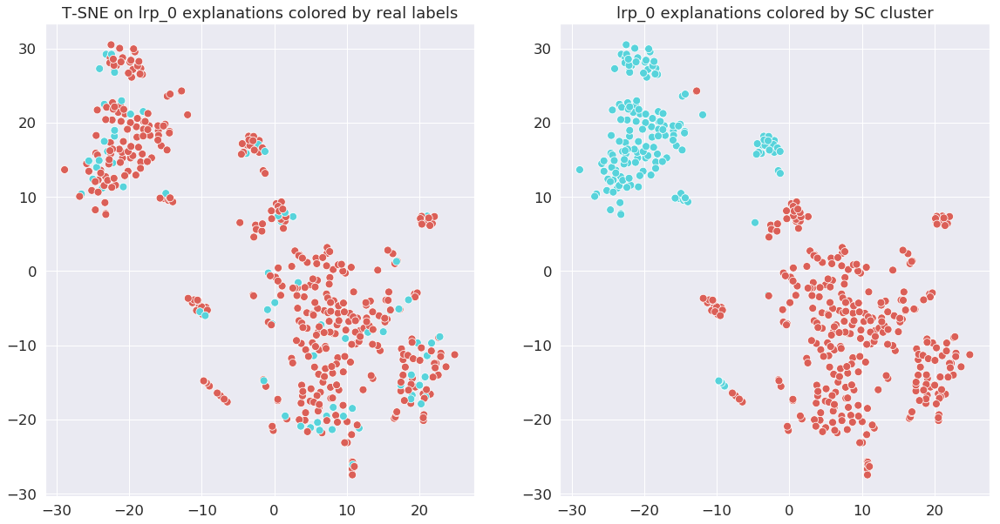

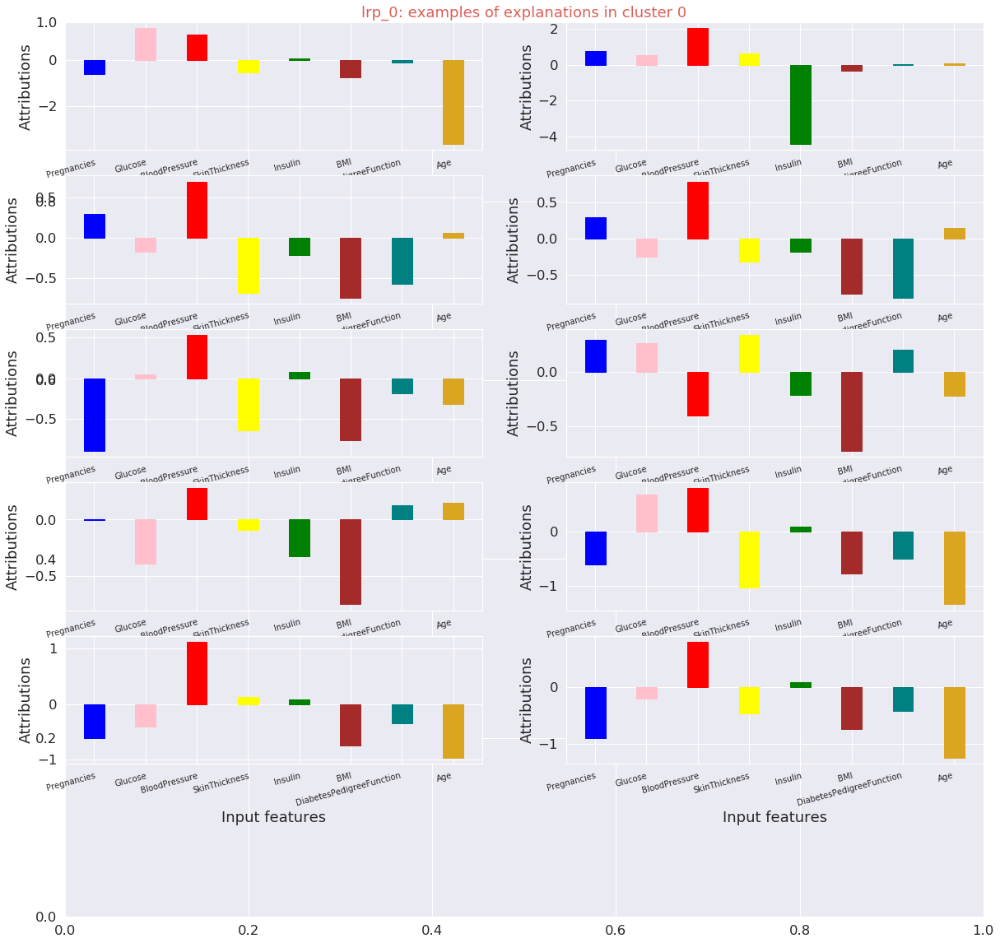

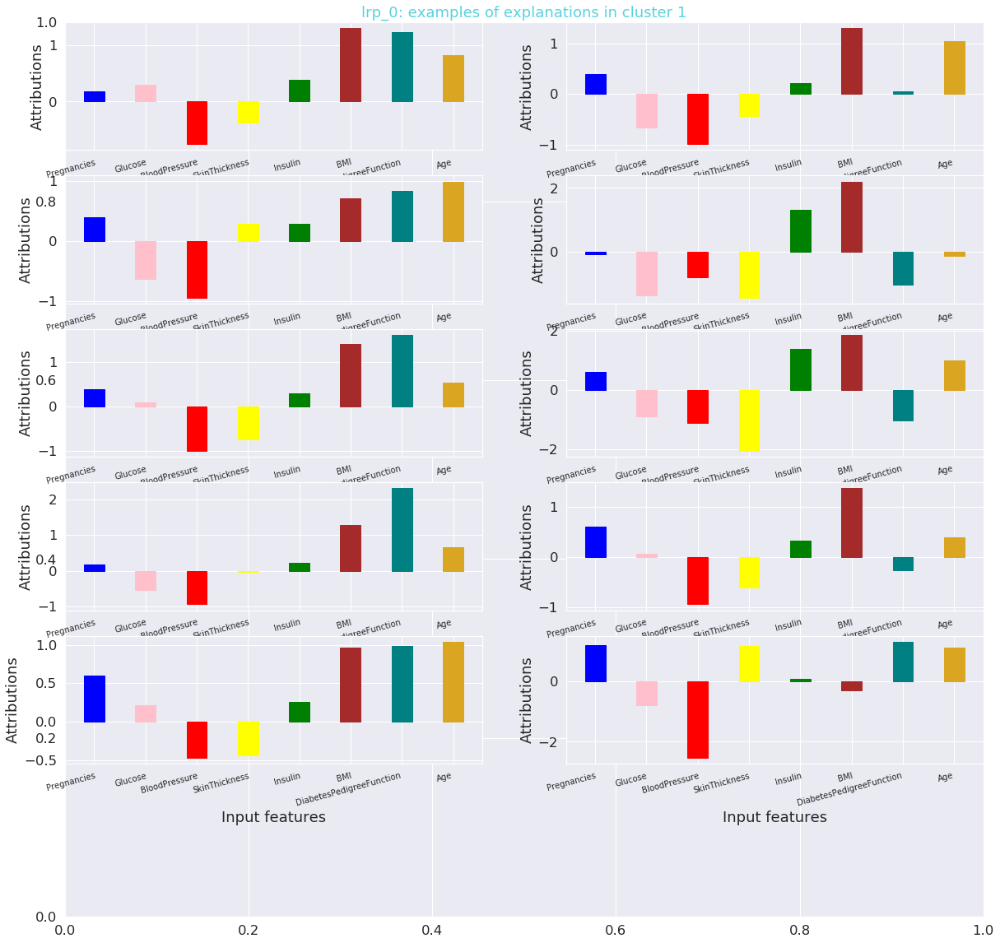

Imaginary values  [0.]


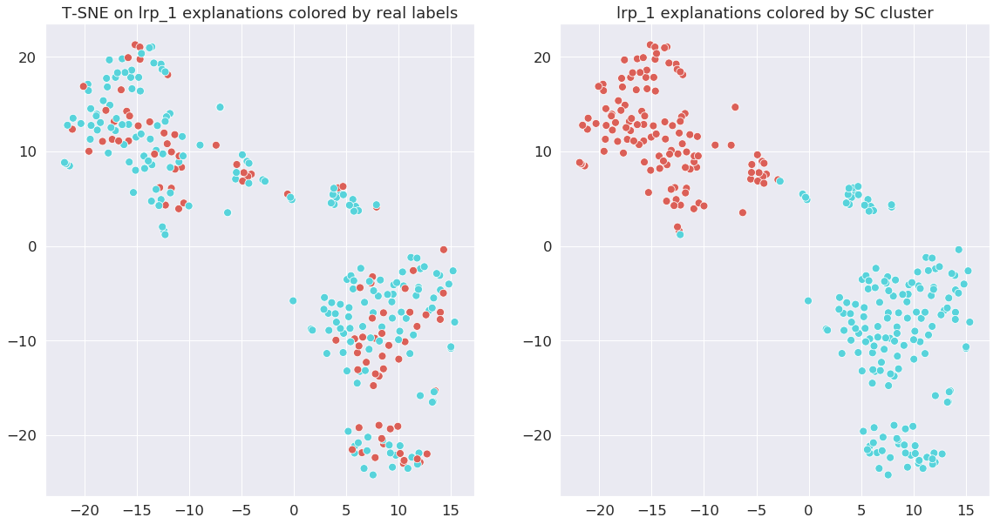

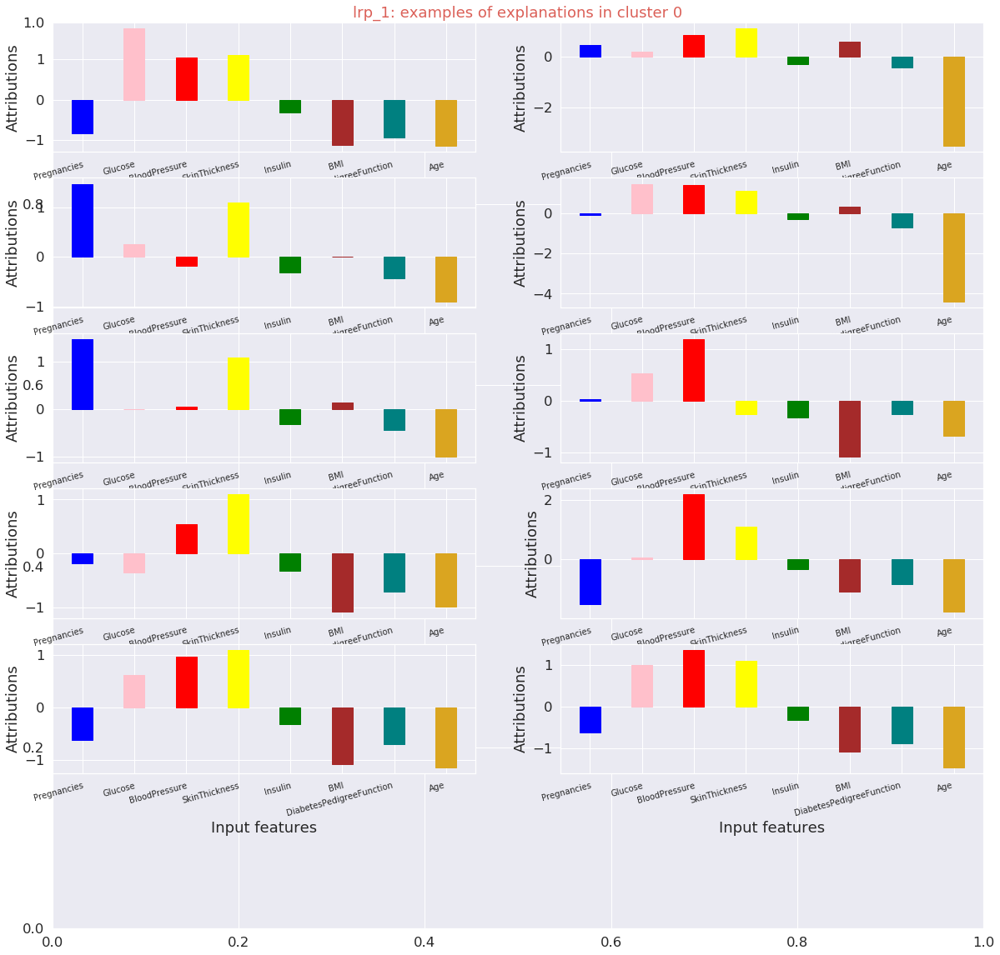

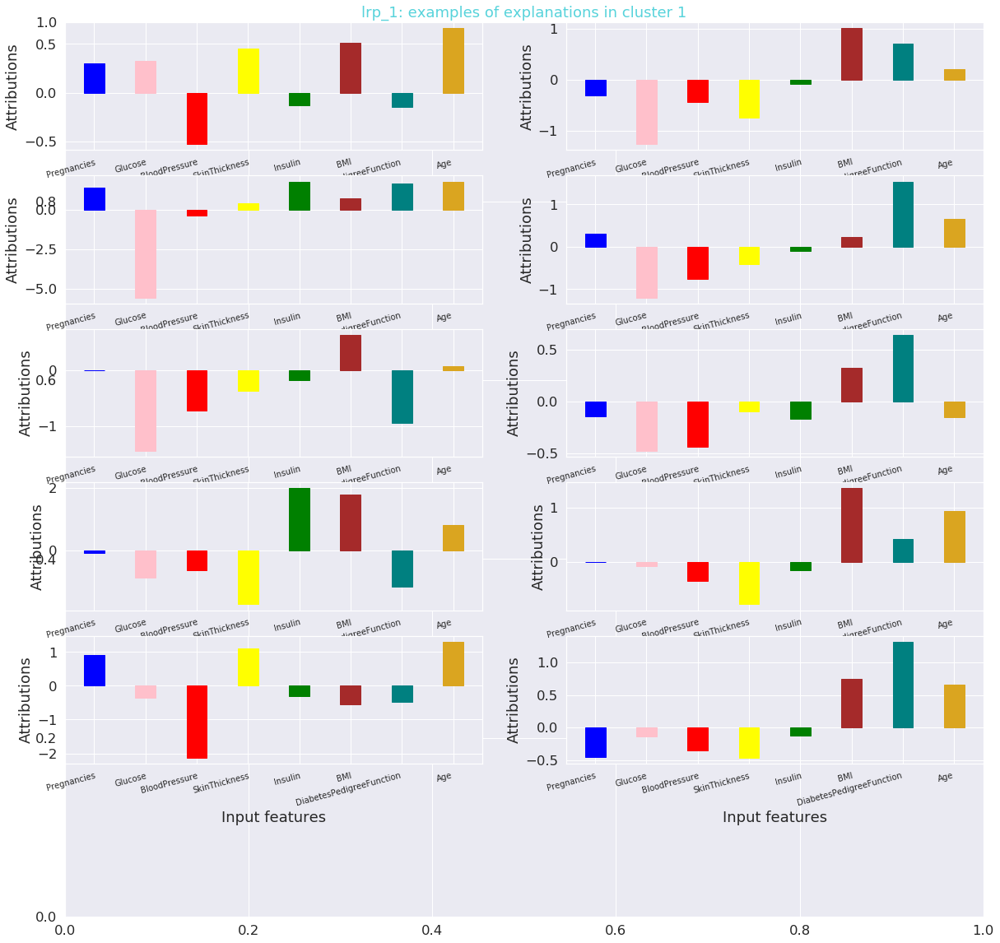

Imaginary values  [0.]


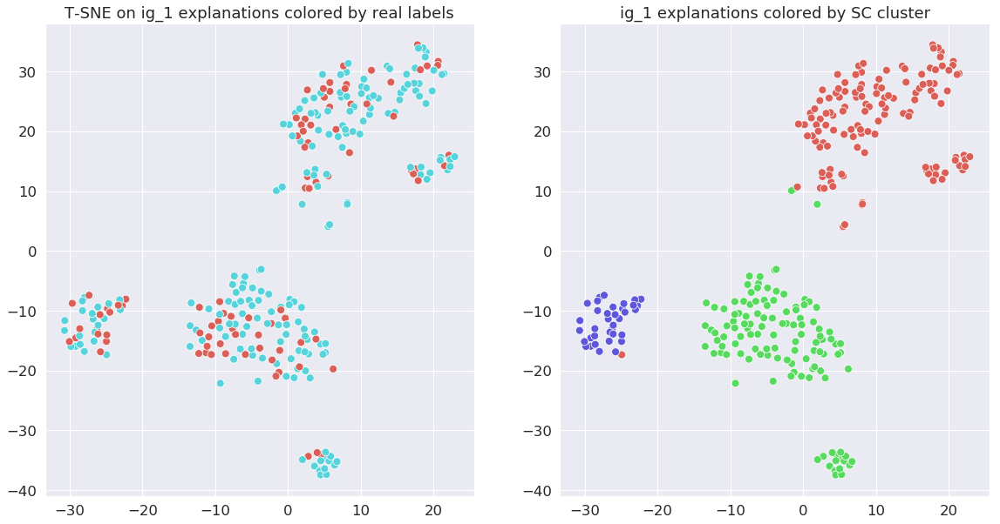

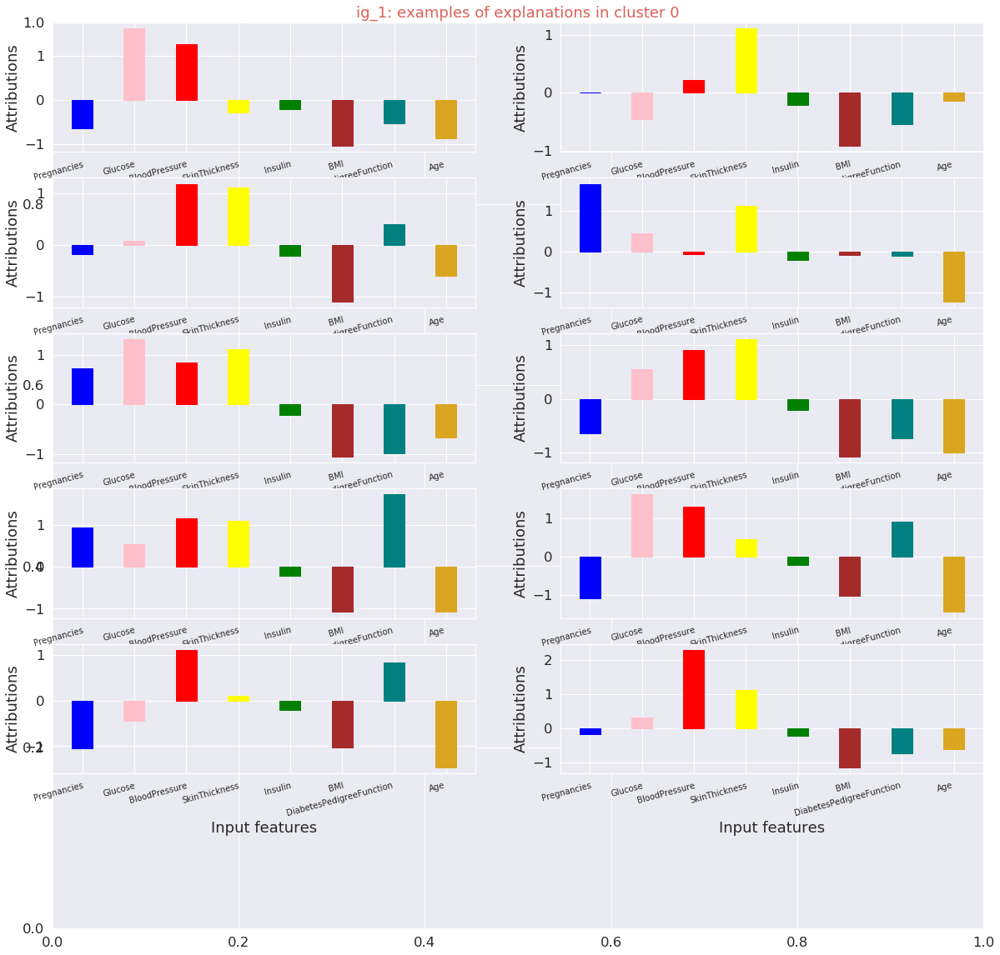

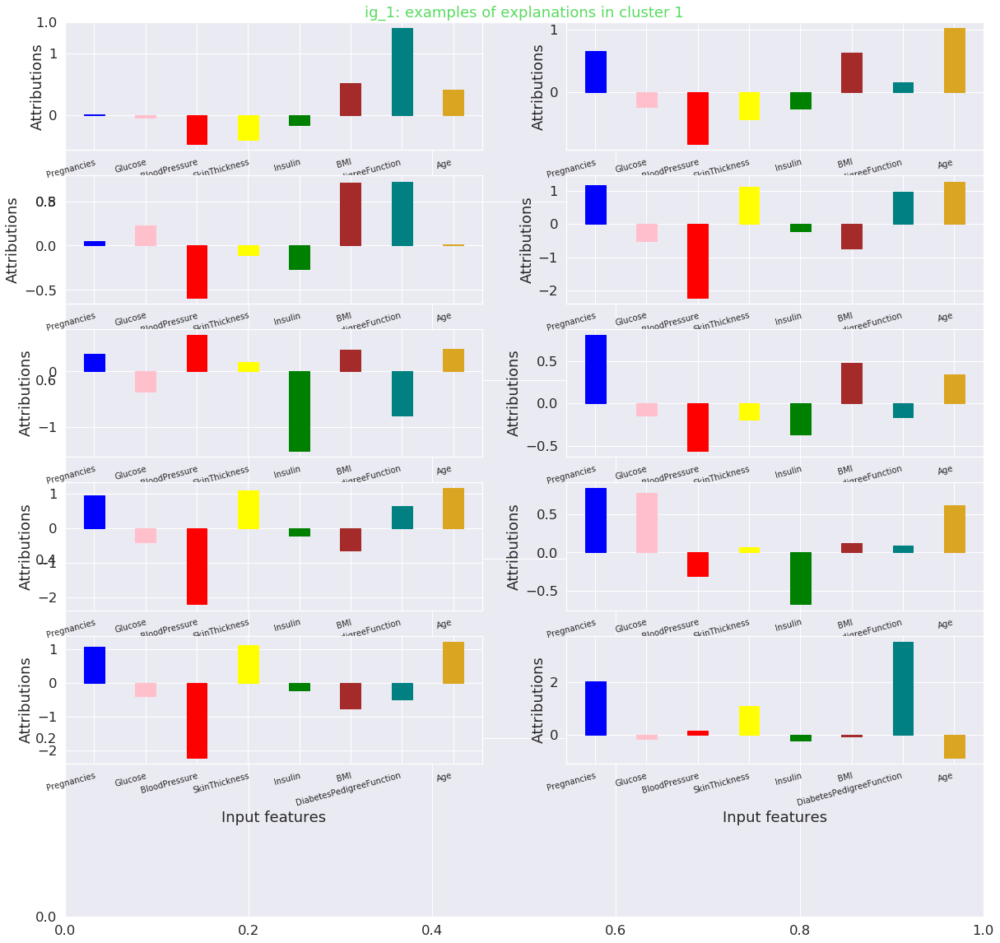

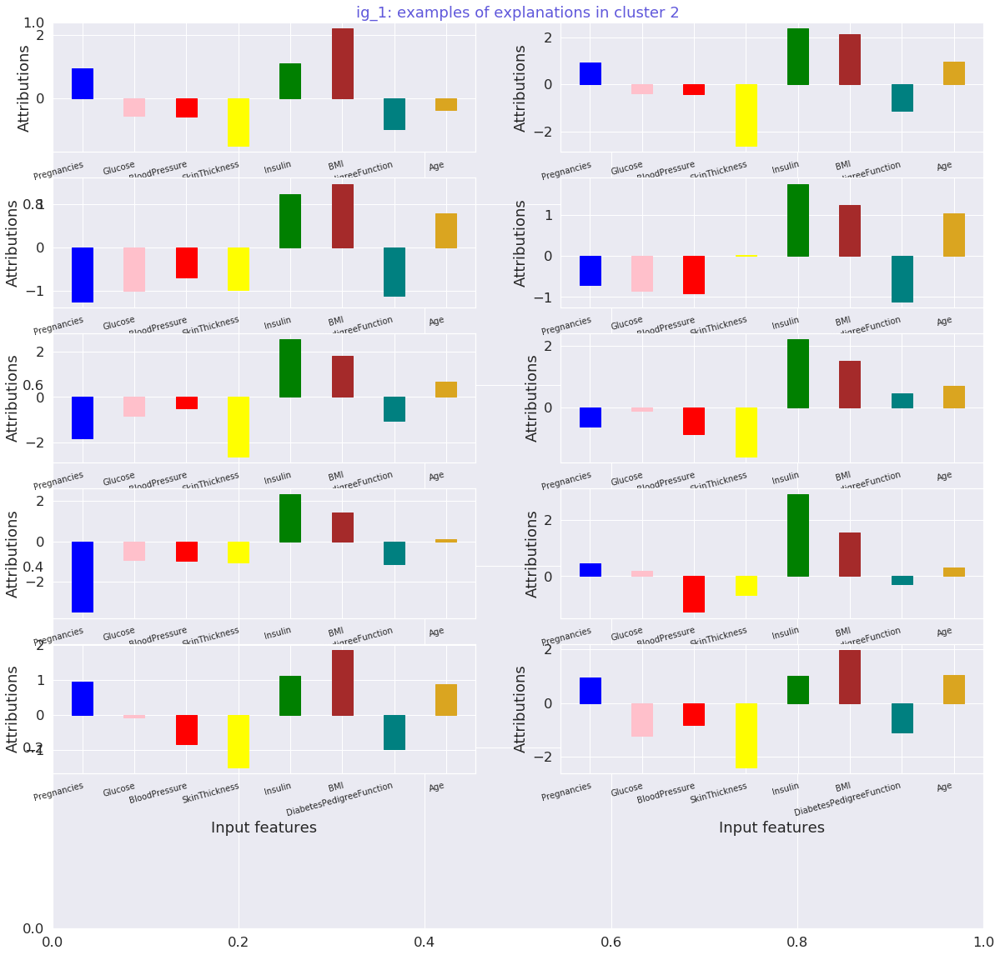

Imaginary values  [0.]


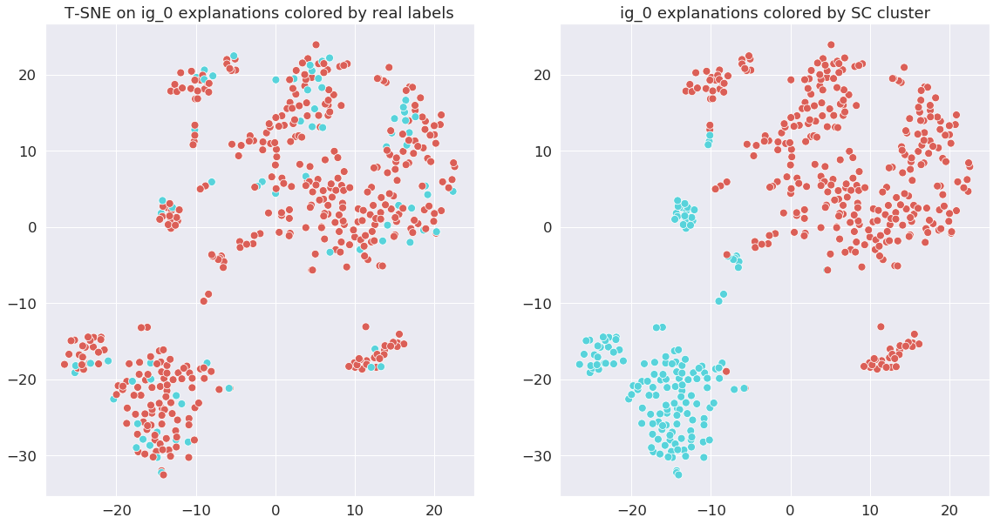

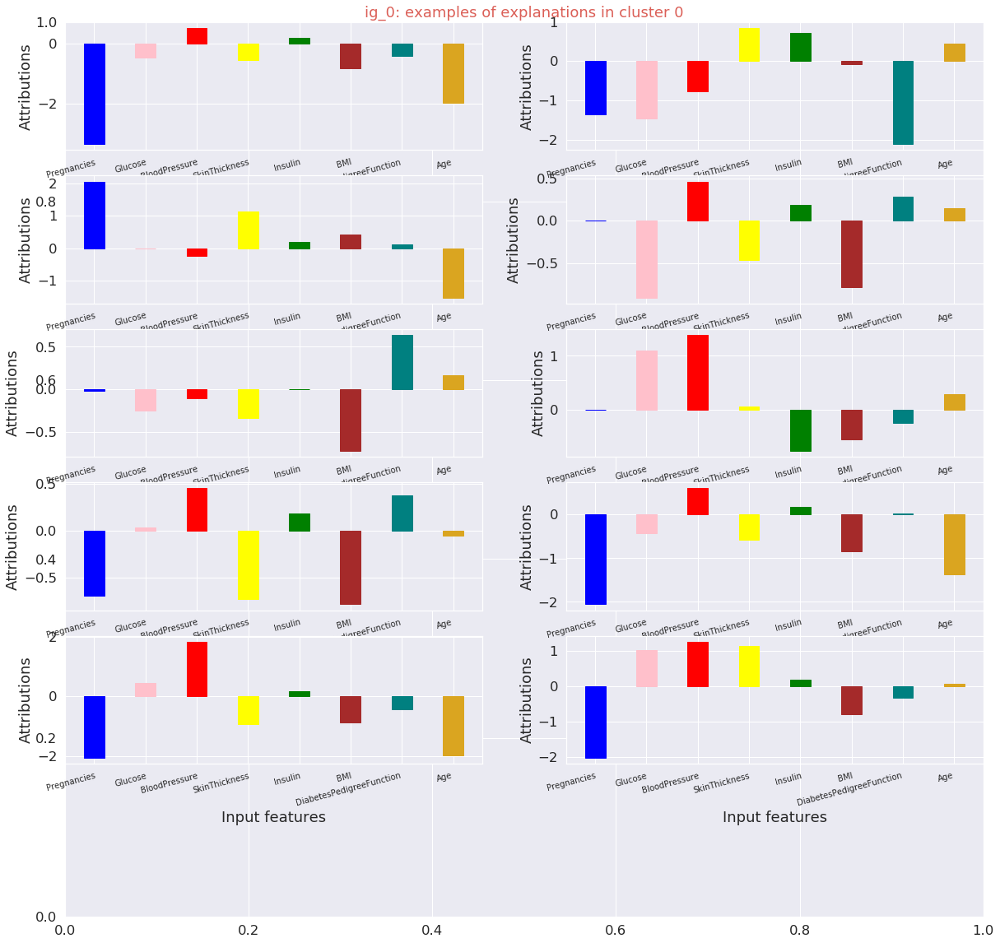

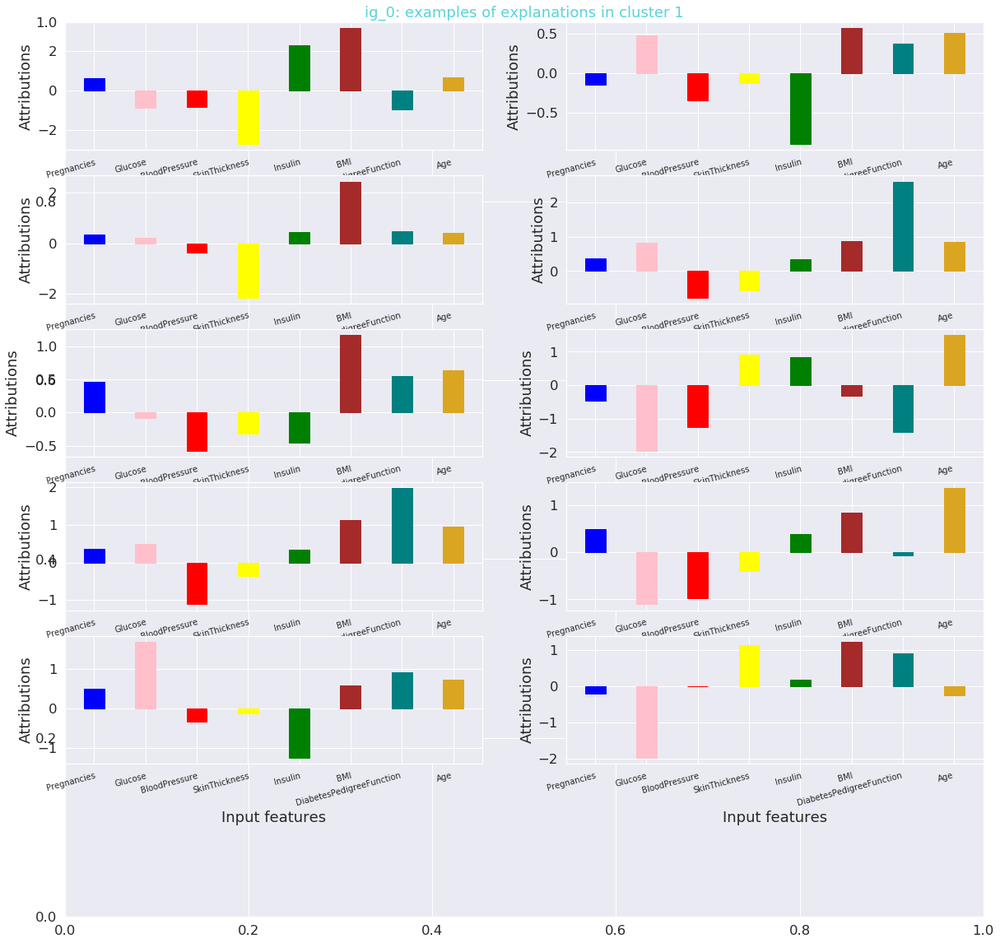

Imaginary values  [0.]


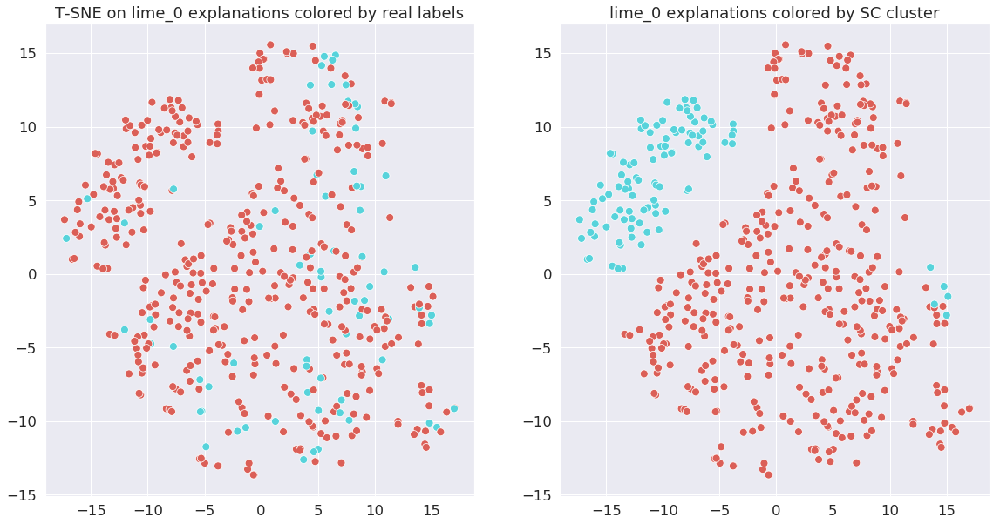

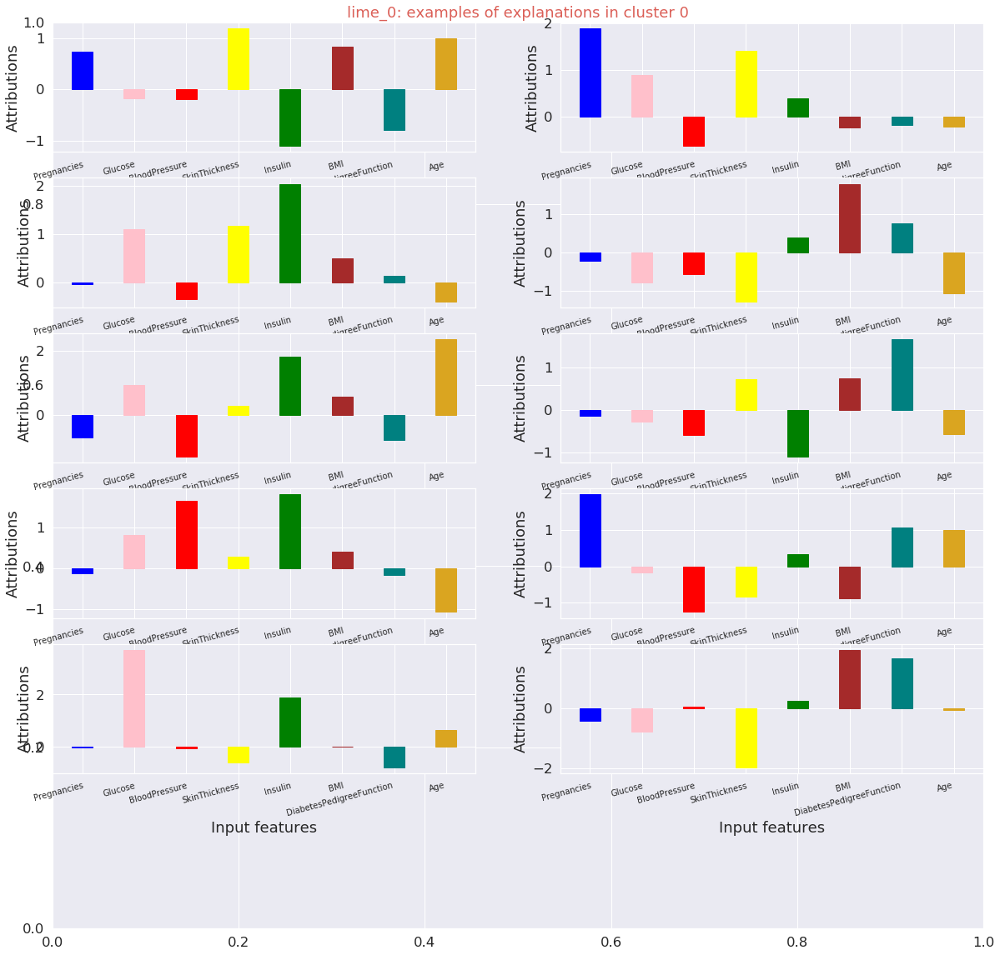

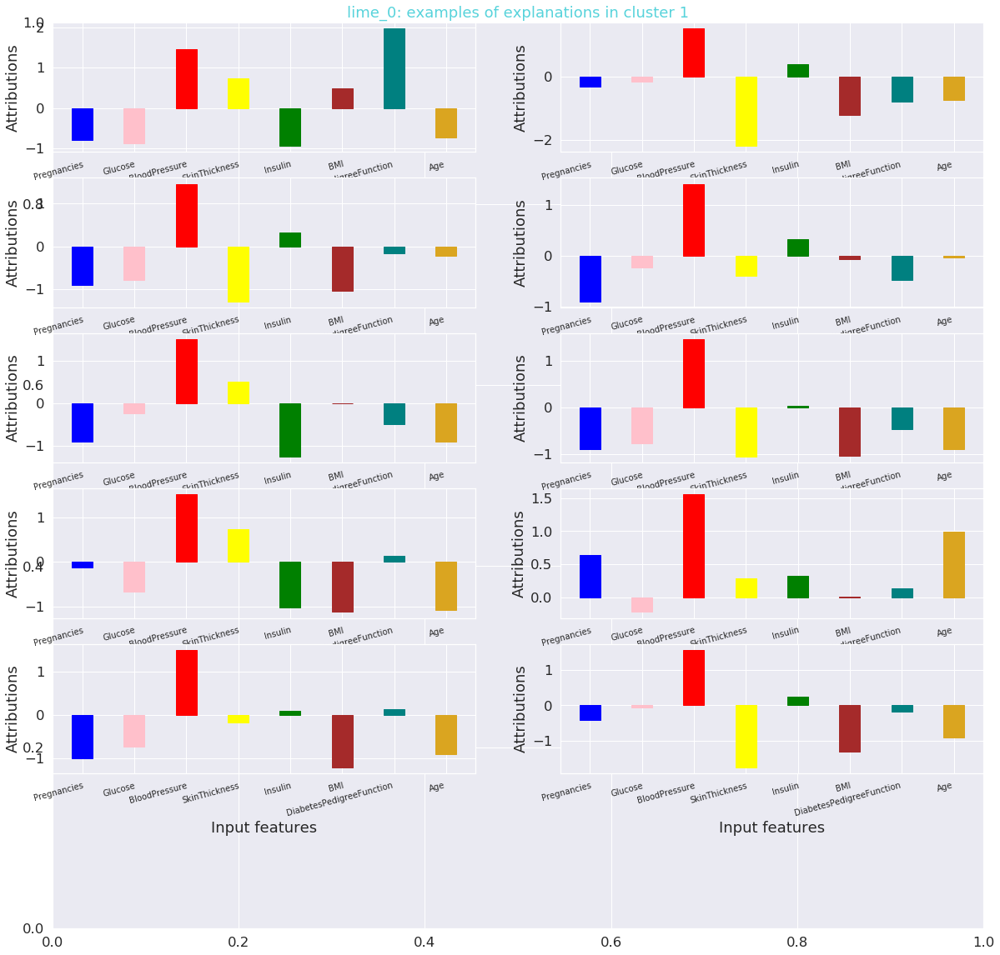

Imaginary values  [0.]


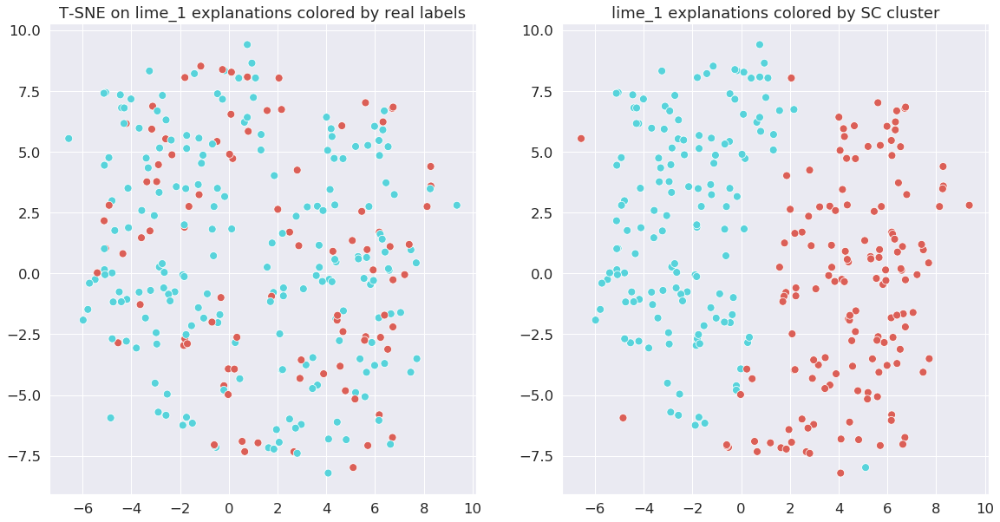

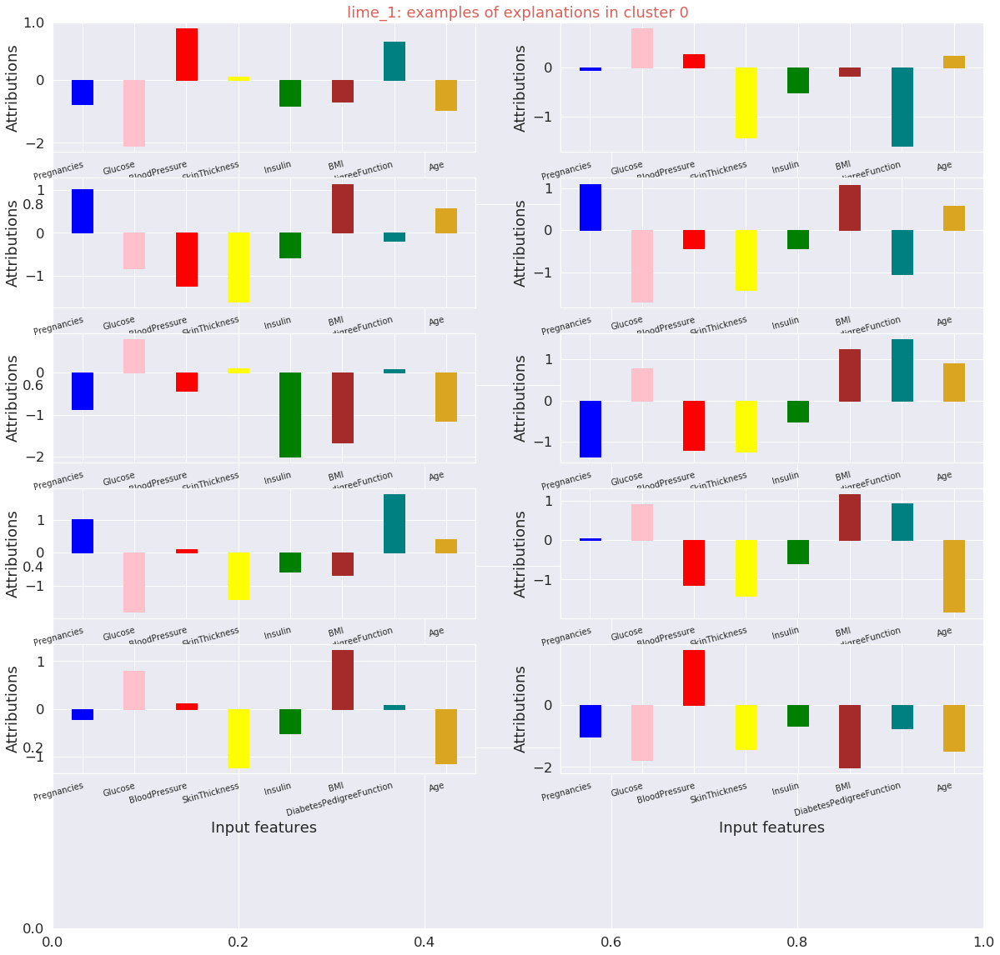

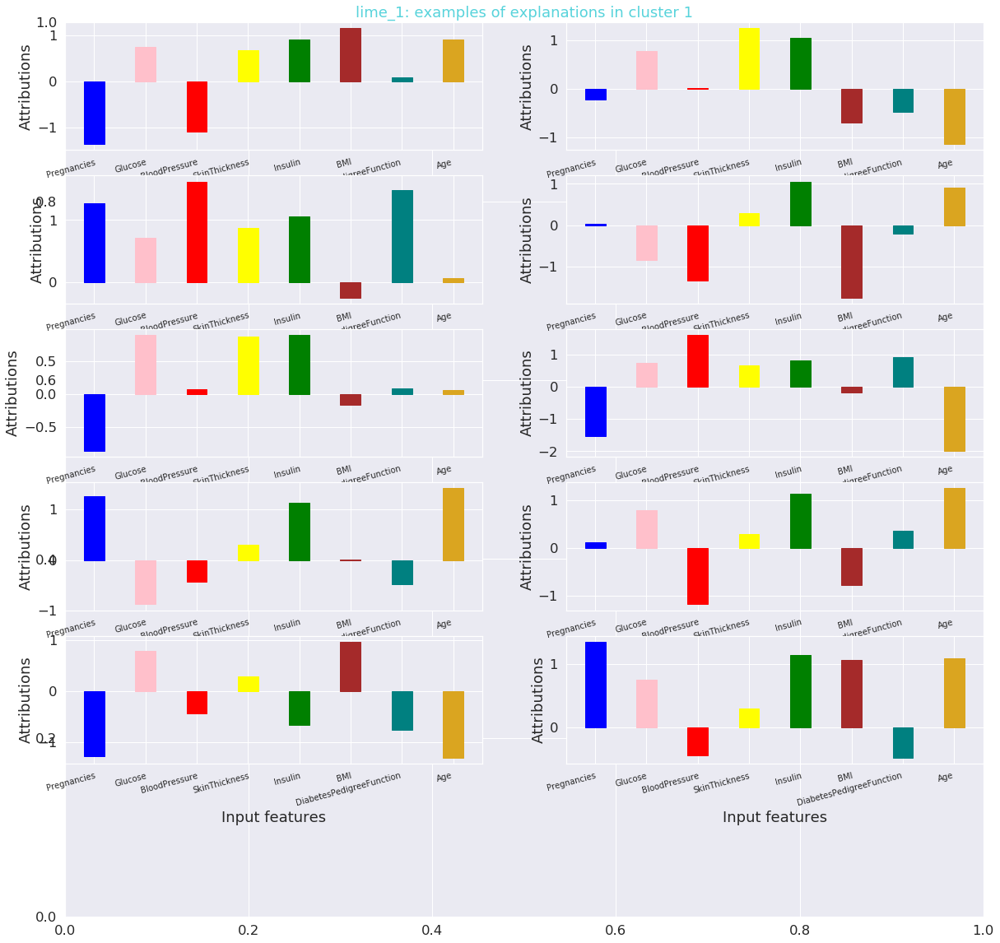

In [26]:
for method, (proy, mat, real_labels) in method_proy_attribution_labels.items():

    rows = 1
    cols = 2
    fig  = plt.figure(figsize = (30, 10))

    colors = clusters_to_colors(real_labels)
    add_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, 1, fig,
                                    "T-SNE on "+str(method)+" explanations colored by real labels")
    # Clustering
    n_clusters = method_class_perplexitys_clusters_dict[method][1]
    n_neighbors = method_class_nneighbors[method]
    clusters = clusters_by_spectral_clustering(mat, n_neighbors, n_clusters)

    # Clustering visualization
    colors = clusters_to_colors(clusters)
    add_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, 2, fig,
                                    method+" explanations colored by SC cluster")

    visualize_some_explanations_by_cluster(method, mat, clusters)

### Assesing faithfulness

It's crucial that the explanations methods we just revised are **faithfull**, i.e:

"The explainer model sufficiently captures the relationship between the complex model predictions and the features in
the local region around a prediction of interest to produce explanations that are faithful to the complex model."

Towards assesing this, we are going to apply XAI methods in a Logistic regression model, which is already
interpretable.


In [83]:
dataset = loadtxt('pima-indians-diabetes.csv', delimiter=',')
# split into input (X) and output (y) variables
X = dataset[:,0:8]
y = dataset[:,8]

means = np.mean(X, axis=0)
stds = np.std(X, axis=0)
X = (X - means)/stds


In [52]:
# contruct model
model = Sequential()
model.add(Dense(1, input_dim=8, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X, y, epochs=100, batch_size=10)
score = model.evaluate(X, y, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])
# save model and architecture to single file
model.save("model_logistic_regression.h5")
print("Saved model to disk")

Epoch 1/100
768/768 [==============================] - 0s - loss: 1.0126 - acc: 0.5417      
Epoch 2/100
768/768 [==============================] - 0s - loss: 0.9429 - acc: 0.5690     
Epoch 3/100
768/768 [==============================] - 0s - loss: 0.8799 - acc: 0.5938     
Epoch 4/100
768/768 [==============================] - 0s - loss: 0.8231 - acc: 0.6068     

In [84]:
# load model
model = load_model('model_logistic_regression.h5')
model.summary()
score = model.evaluate(X, y, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 1)                 9         
Total params: 9
Trainable params: 9
Non-trainable params: 0
_________________________________________________________________
Test loss: 0.4710118994116783
Test accuracy: 0.78515625


In [85]:
preds = model.predict(X) > 0.5
preds = preds.astype(int)
real_y_of_0_preds = y[np.where(preds==0)[0]]
real_y_of_1_preds = y[np.where(preds==1)[0]]

Interpreting the Logistic Model

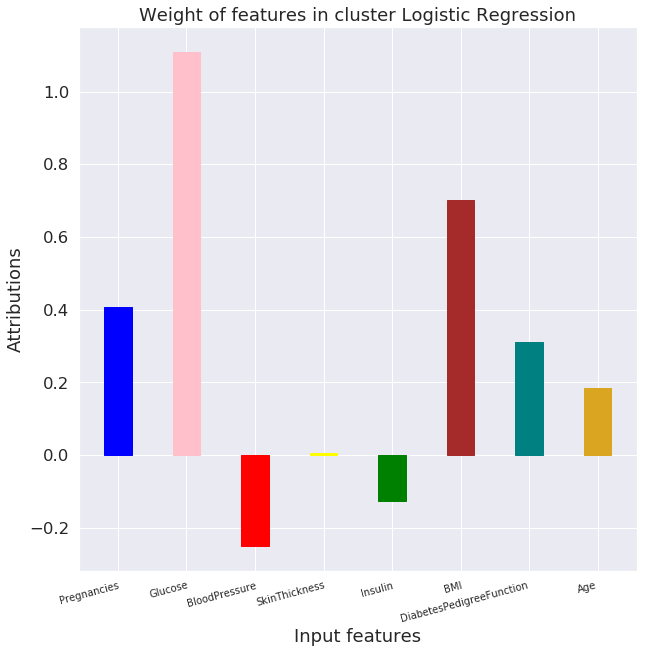

In [86]:
# Visualization
rows = 1
columns = 1
fig  = plt.figure(figsize = (10, 10))
title_obj = plt.title("Weight of features in cluster Logistic Regression")
w = model.layers[0].get_weights()
coeff = np.array([item.sum() for sublist in w for item in sublist][:-1])

ax1 = fig.add_subplot(rows, columns, 1)
ax1.set_xlabel("Input features")
ax1.set_ylabel("Attributions")
plt.setp(ax1.get_xticklabels(), rotation=15, ha="right",
     rotation_mode="anchor", fontsize=10)
barlist = plt.bar(labels, coeff.reshape(-1,), color ='black', width = 0.4)
for k in range(len(labels)):
    barlist[k].set_color(bar_colors[k])
plt.show()

In [87]:
data = []
index = []


n_1_class = np.count_nonzero(preds)
n_0_class = len(preds)-n_1_class
n_explanations = X.shape[0]

eX_1_lrp = np.zeros((n_1_class,8))
eX_0_lrp = np.zeros((n_0_class,8))
eX_1_ig = np.zeros((n_1_class,8))
eX_0_ig = np.zeros((n_0_class,8))


method_attribution_dict = {'ig_1': ("lr_ig_attributtions_1.txt", eX_1_ig),
                                      'lrp_1': ('lr_lrp_attributions_1.txt', eX_1_lrp),
                                      'ig_0': ("lr_ig_attributtions_0.txt", eX_0_ig),
                                      'lrp_0': ('lr_lrp_attributions_0.txt', eX_0_lrp)}



In [88]:
# Statistics
times_lrp = np.ndarray((n_explanations,))
times_ig = np.ndarray((n_explanations,))

# Counters of explanations per class
j_0 = 0
j_1 = 0

for i in range(n_explanations):

    # input to explain
    xs = X[[i]]

    # For dividing explanations for SpRAy
    x_class = preds[i]

    # Explanations
    with DeepExplain(session=K.get_session()) as de:

        # Need to reconstruct the graph in DeepExplain context, using the same weights.
        # With Keras this is very easy:
        # 1. Get the input tensor to the original model
        input_tensor = model.layers[0].input

        # 2. We now target the output of the last dense layer (pre-softmax)
        # To do so, create a new model sharing the same layers untill the last dense (index -2)
        fModel = Model(inputs=input_tensor, outputs = model.layers[-1].output)
        target_tensor = fModel(input_tensor)

        # method 1

        # parameters
        arg = 100
        method_name = 'IG'

        # explanations
        begin = time.time()
        explanation = de.explain('intgrad', target_tensor, input_tensor, xs, steps=arg)
        time.sleep(1)
        end = time.time()

        # records
        times_ig[i] = end - begin

        if x_class == 0:
            eX_0_ig[j_0] = explanation
        else:
            eX_1_ig[j_1] = explanation


        # method 2

        # parameters
        arg = 0.0001
        method_name = 'LRP'

        # explanation
        begin = time.time()
        explanation = de.explain('elrp', target_tensor, input_tensor, xs, epsilon=arg)
        time.sleep(1)
        end = time.time()

        # record
        if x_class == 0:
            eX_0_lrp[j_0] = explanation
            j_0 += 1
        else:
            eX_1_lrp[j_1] = explanation
            j_1 += 1

        times_lrp[i] = end - begin

Save explanations and report running time

In [89]:
method_name = 'IG'
method_dict = {"Mean time": times_ig.mean()}
data.append(method_dict)
index.append(method_name)

method_name = 'LRP'
method_dict = {"Mean time": times_lrp.mean()}
data.append(method_dict)
index.append(method_name)

time_table = pd.DataFrame(data, index=index)
print(time_table)

for (filename, mat) in method_attribution_dict.values():
    mat = np.matrix(mat)
    with open(filename,'wb') as f:
        for line in mat:
            np.savetxt(f, line, fmt='%.2f')

     Mean time
IG    1.499702
LRP   1.479213


### SpRAy on IG, LRP and LIME


Besides explanations made by LRP and IG, we load explanations of LIME computed in other notebook.

In [ ]:
method_attribution_dict = {'ig_1': ("ig_attributtions_1.txt", 0),
                                      'lrp_1': ('lr_lrp_attributions_1.txt', 0),
                                      'ig_0': ("lr_ig_attributtions_0.txt", 0),
                                      'lrp_0': ('lr_lrp_attributions_0.txt', 0),
                                      'lime_1': ("lr_lime_attributtions_1.txt", 0),
                                      'lime_0': ('lr_lime_attributtions_0.txt', 0)}

In [ ]:
for method, (filename, mat) in method_attribution_dict.items():
    # Read attribution matrix of method
    mat = np.loadtxt(filename, dtype=float)
    print(filename + " dims = ", mat.shape)
    method_attribution_dict[method] = (filename, mat)


Normalize explanations

In [ ]:
for method, (filename, mat) in method_attribution_dict.items():
    # Normalize attributions
    scaler = preprocessing.StandardScaler().fit(mat)
    method_attribution_dict[method] = (filename, scaler.transform(mat))



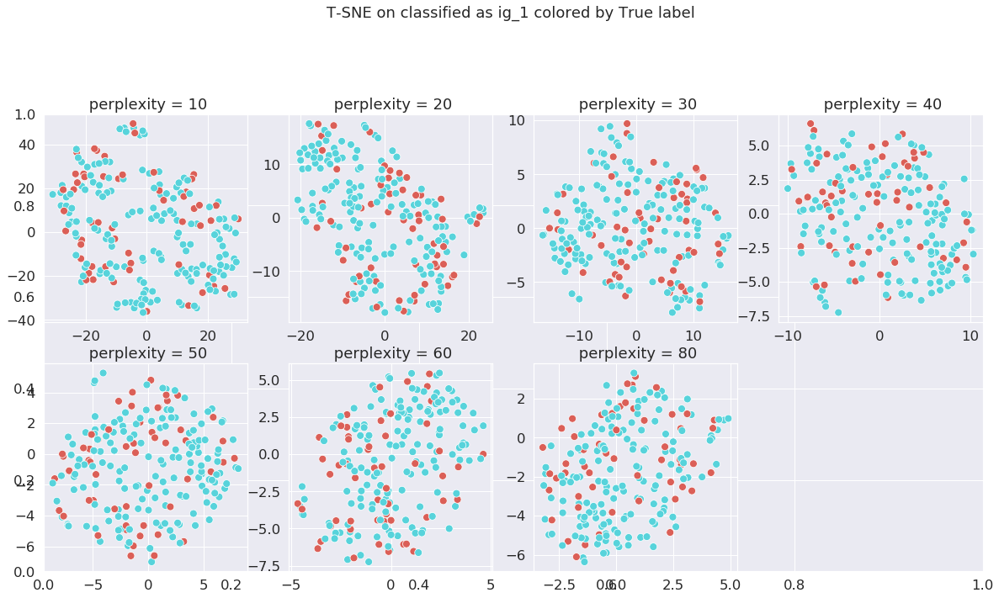

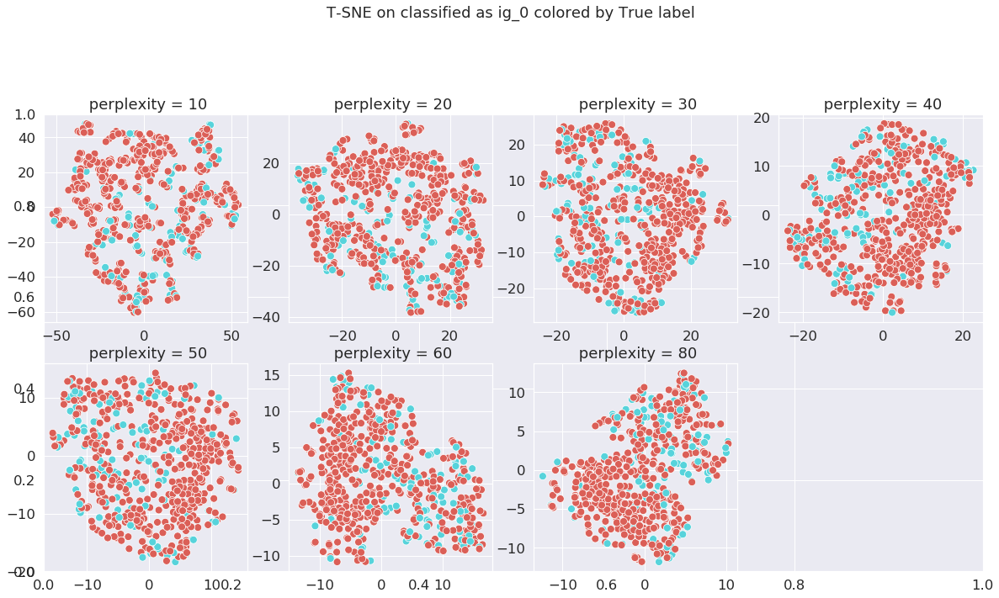

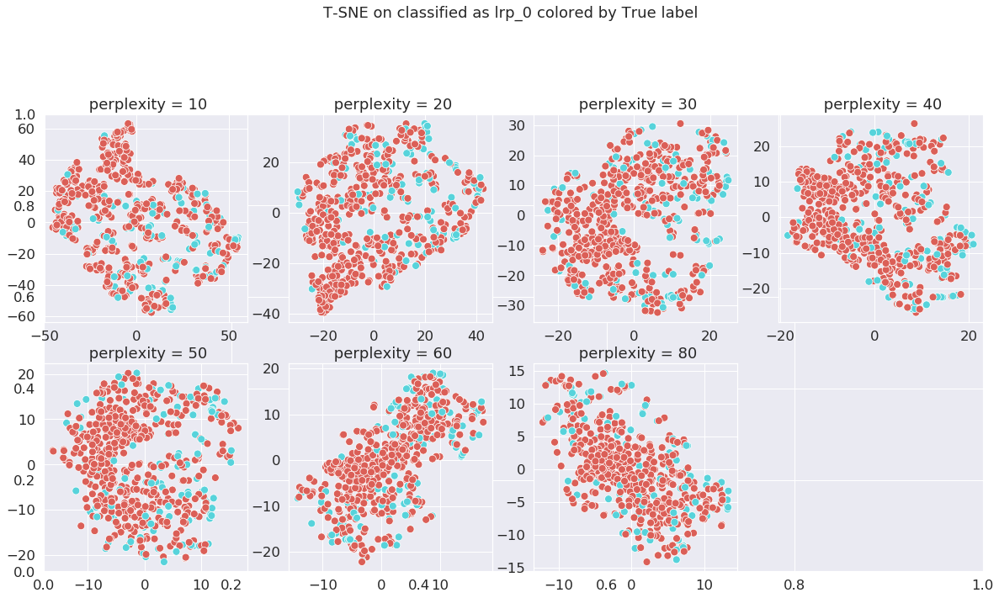

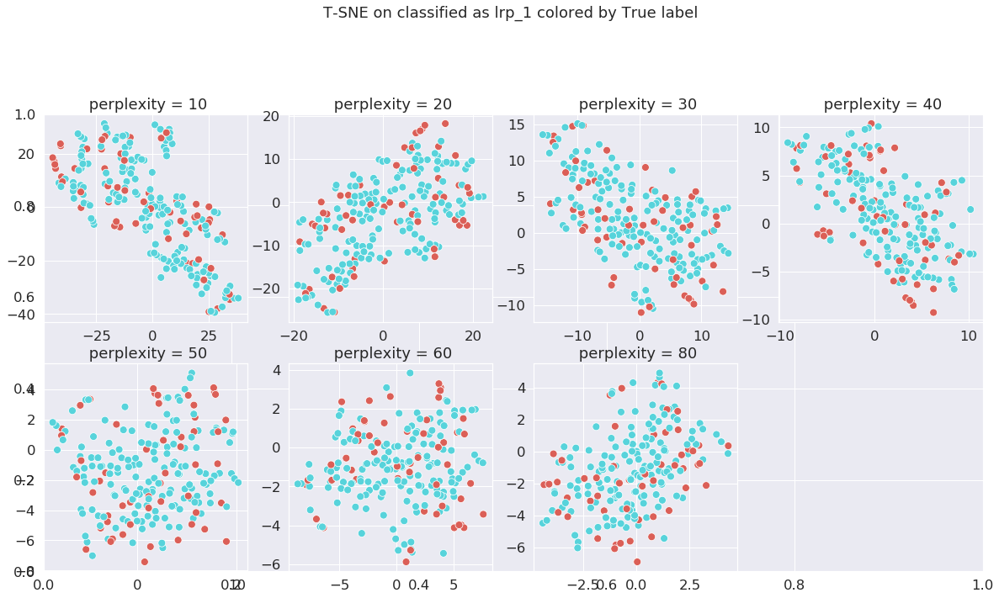

In [92]:

for method, (filename, mat) in method_attribution_dict.items():

    perplexitys = [10, 20, 30, 40, 50, 60, 80]
    rows = 2
    columns = (len(perplexitys)+1)/2
    fig  = plt.figure(figsize = (20, 10))

    if method[-1] == str(0):
        clusters = real_y_of_0_preds
    else:
        clusters = real_y_of_1_preds

    colors = clusters_to_colors(clusters)
    plt.title("T-SNE on classified as "+str(method)+" colored by True label ", y=1.2)
    for k, perplexity in enumerate(perplexitys):
        proy = TSNE(random_state=RANDOM_SEED, perplexity=perplexity).fit_transform(mat)
        add_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, k+1, fig,
                                    " perplexity = "+str(perplexity))



In [93]:
method_class_perplexitys_clusters_dict = dict()

method_class_perplexitys_clusters_dict['lrp_0'] = (80, 2)
method_class_perplexitys_clusters_dict['lrp_1'] = (90, 2)

method_class_perplexitys_clusters_dict['ig_1'] = (50, 2)
method_class_perplexitys_clusters_dict['ig_0'] = (80, 2)

method_class_perplexitys_clusters_dict['lime_0'] = (50, 2)
method_class_perplexitys_clusters_dict['lime_1'] = (60, 2)


method_proy_attribution_labels = dict()
for method, (filename, mat) in method_attribution_dict.items():

    perplexity = method_class_perplexitys_clusters_dict[method][0]

    proy = TSNE(random_state=RANDOM_SEED, perplexity=perplexity).fit_transform(mat)

    if method[-1] == str(0): real_labels = real_y_of_0_preds
    else:
        real_labels = real_y_of_1_preds

    method_proy_attribution_labels[method] = (proy, mat, real_labels)

Election of number of neighbours for Laplacian graph.

Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]


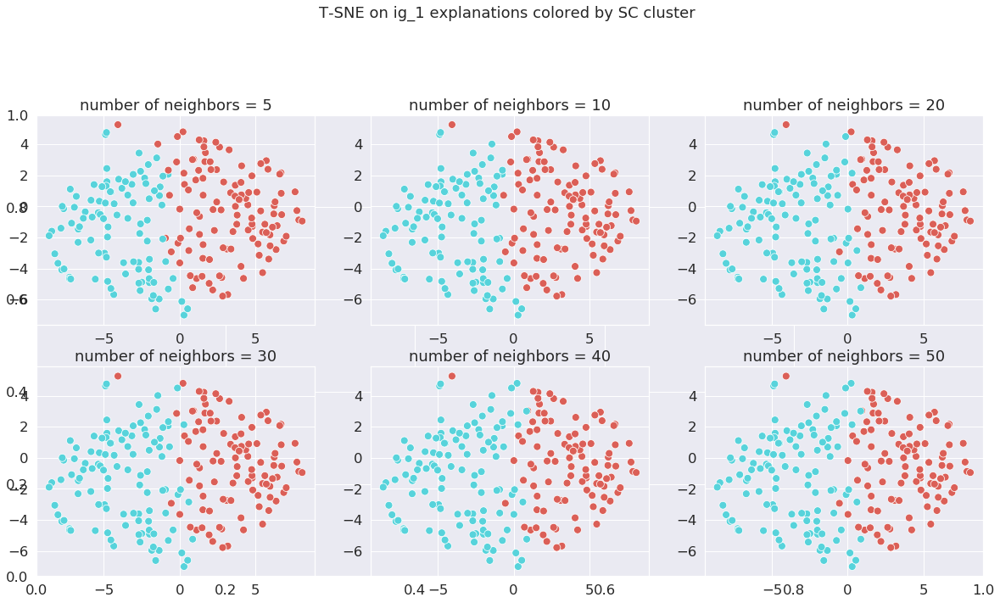

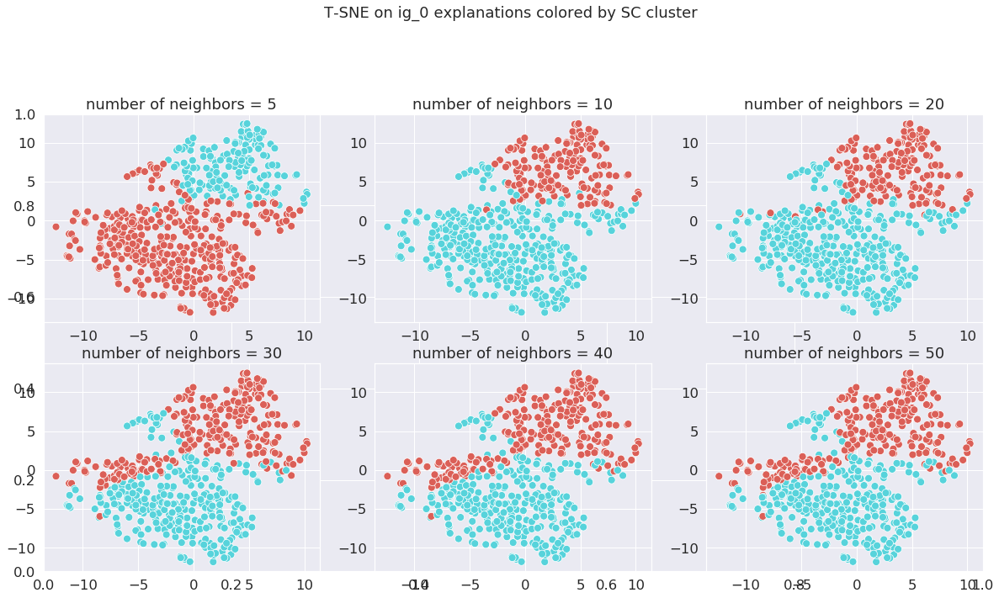

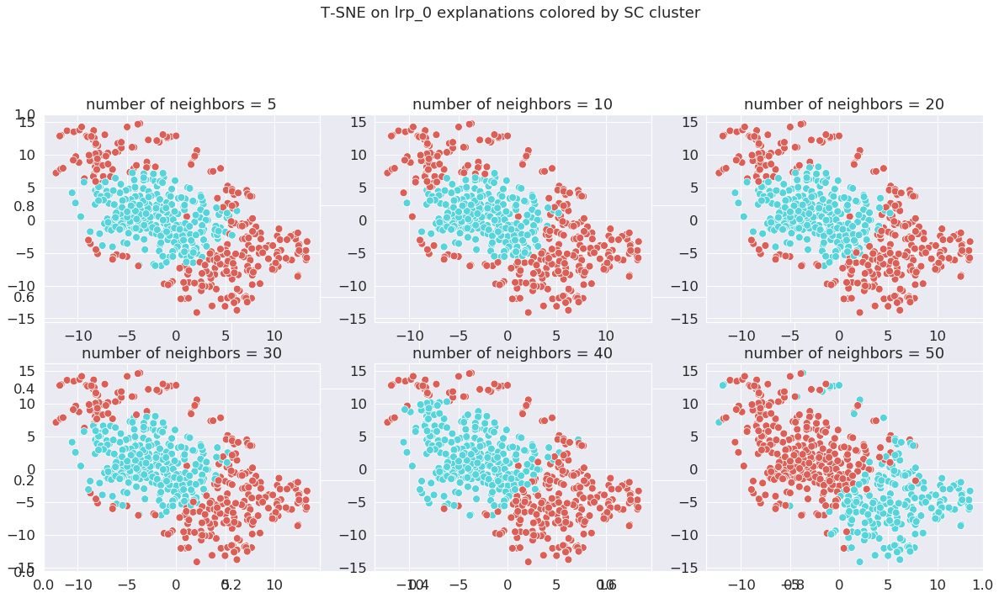

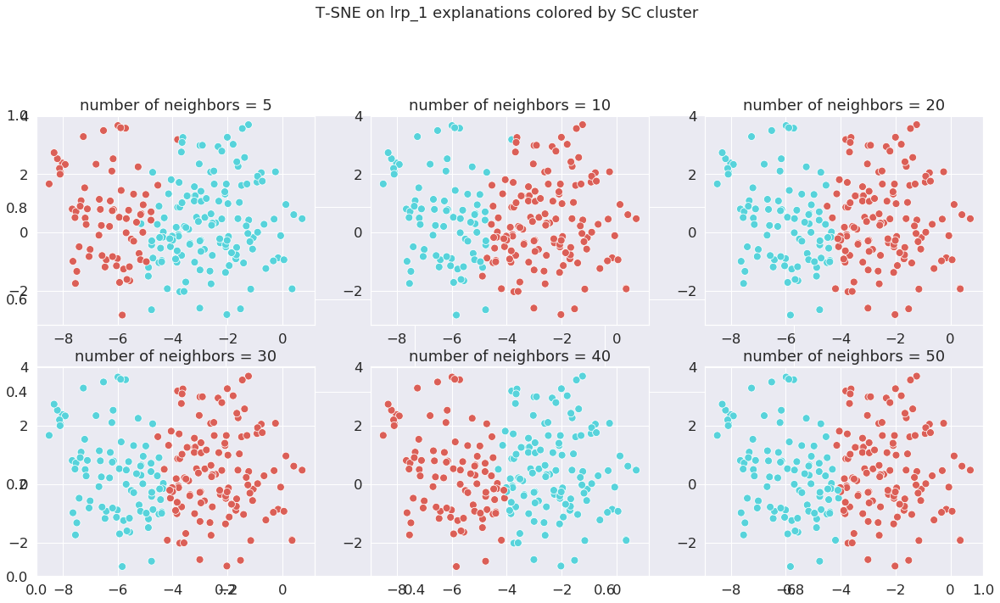

In [94]:
for method, (proy, mat, real_labels) in method_proy_attribution_labels.items():

    neighbors_opt = [5, 10, 20, 30, 40, 50]
    rows = 2
    columns = (len(neighbors_opt)+1)/2
    fig  = plt.figure(figsize = (20, 10))
    plt.title("T-SNE on "+str(method)+" explanations colored by SC cluster ", y=1.2)

    # Clustering
    n_clusters = method_class_perplexitys_clusters_dict[method][1]

    # Clustering visualization
    for k, n_neighbors in enumerate(neighbors_opt):
        clusters = clusters_by_spectral_clustering(mat, n_neighbors, n_clusters)
        colors = clusters_to_colors(clusters)
        add_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, k+1, fig,
                                        "number of neighbors = "+str(n_neighbors))

In [95]:
method_class_nneighbors = dict()

method_class_nneighbors['lrp_0'] = 30
method_class_nneighbors['lrp_1'] = 10

method_class_nneighbors['ig_1'] = 20
method_class_nneighbors['ig_0'] = 10

method_class_nneighbors['lime_0'] = 10
method_class_nneighbors['lime_1'] = 5


### Visualization of explanations (t-SNE + SC)

All the scatterplots show T-SNE projections of explanations onto firts two principal components.
The explanations in a scatterplot correspond only to one method and to one predicted class, e.g.
"ig_1" is the shorthand for explanations of Integrated gradient (IG), classified as members of class 1
by the model.

Scatterplots at left are colored by their true class, and the ones at right are colored by Spectral clustering (SC)
cluster.

Barplots below are examples of explanations grouped by cluster.

Imaginary values  [0.]


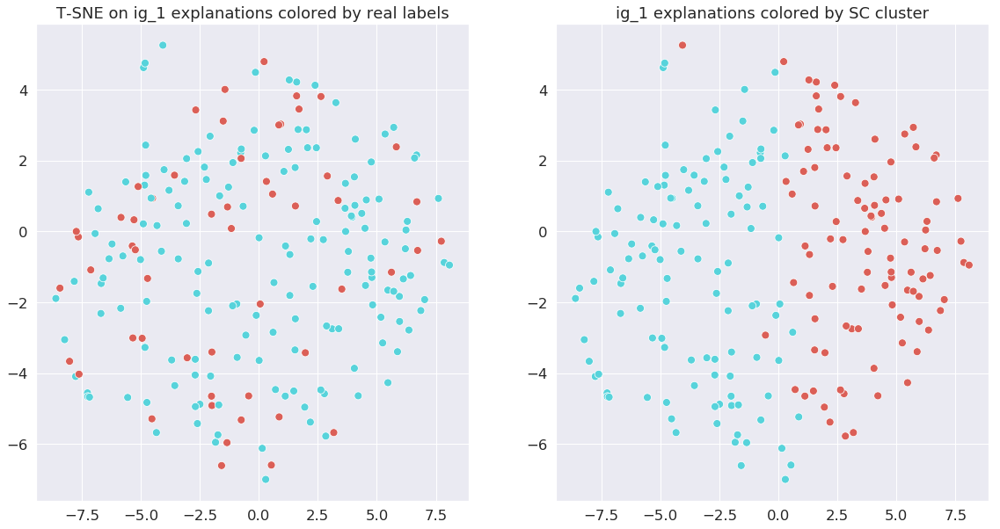

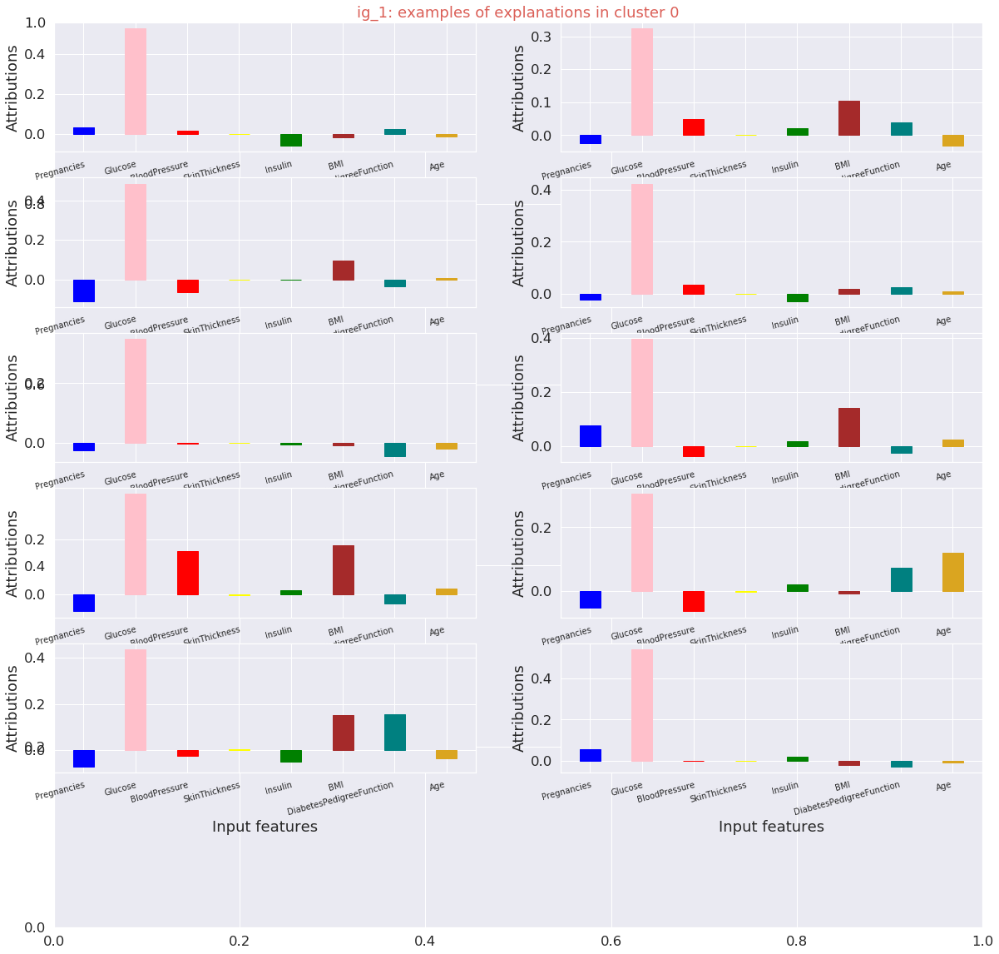

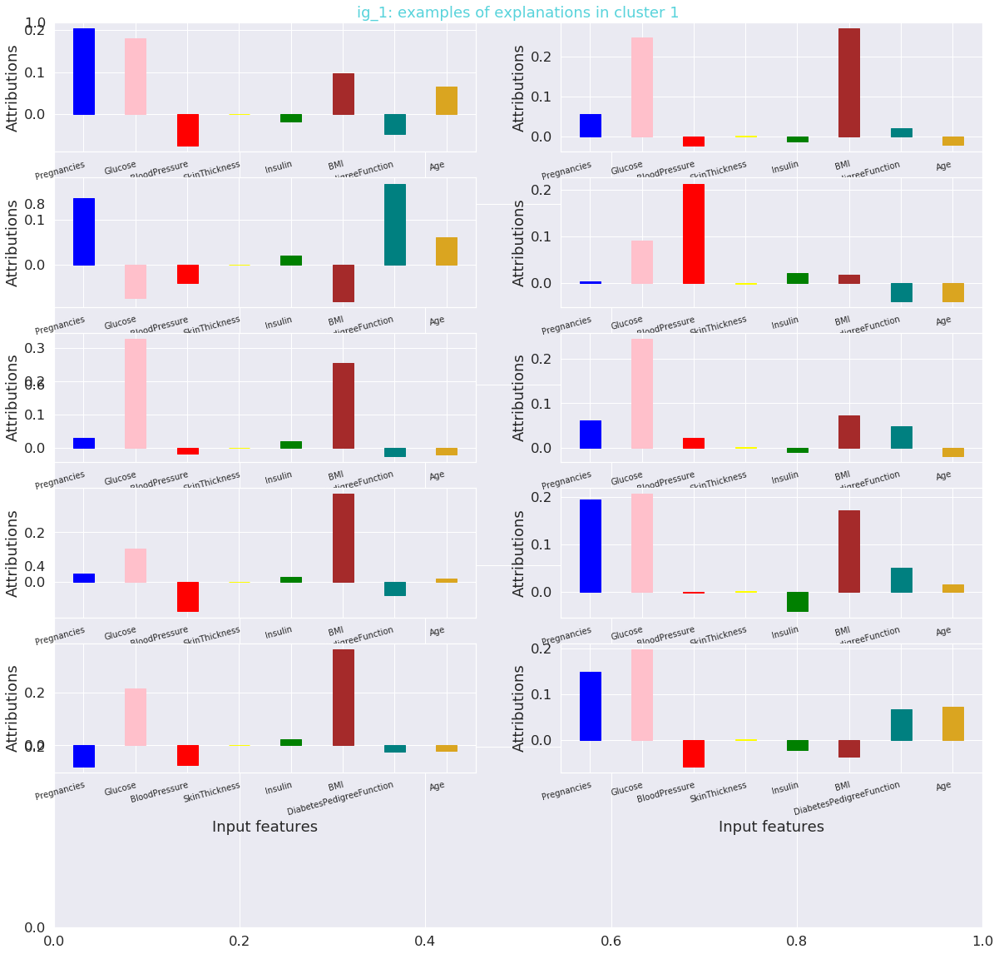

Imaginary values  [0.]


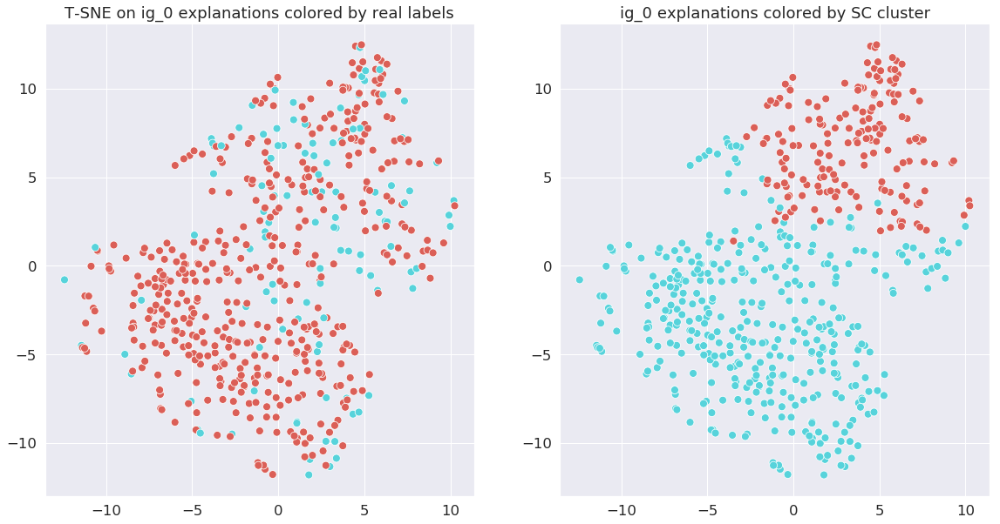

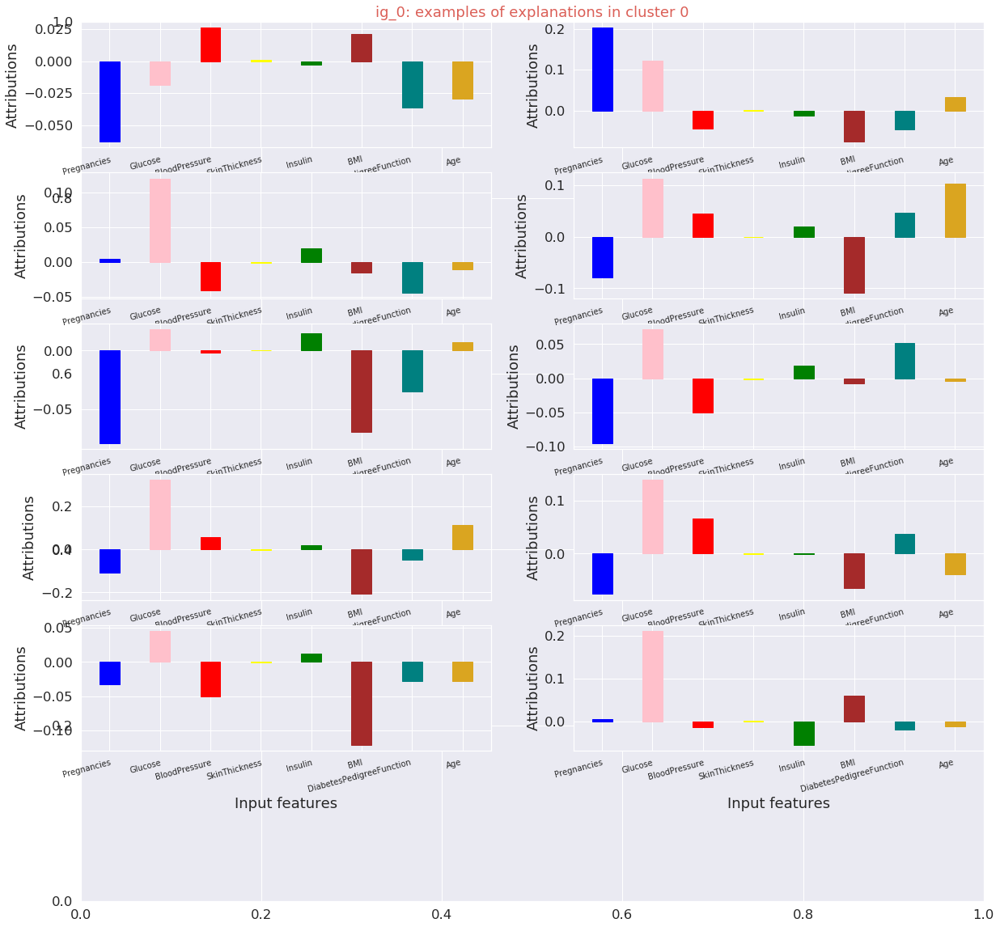

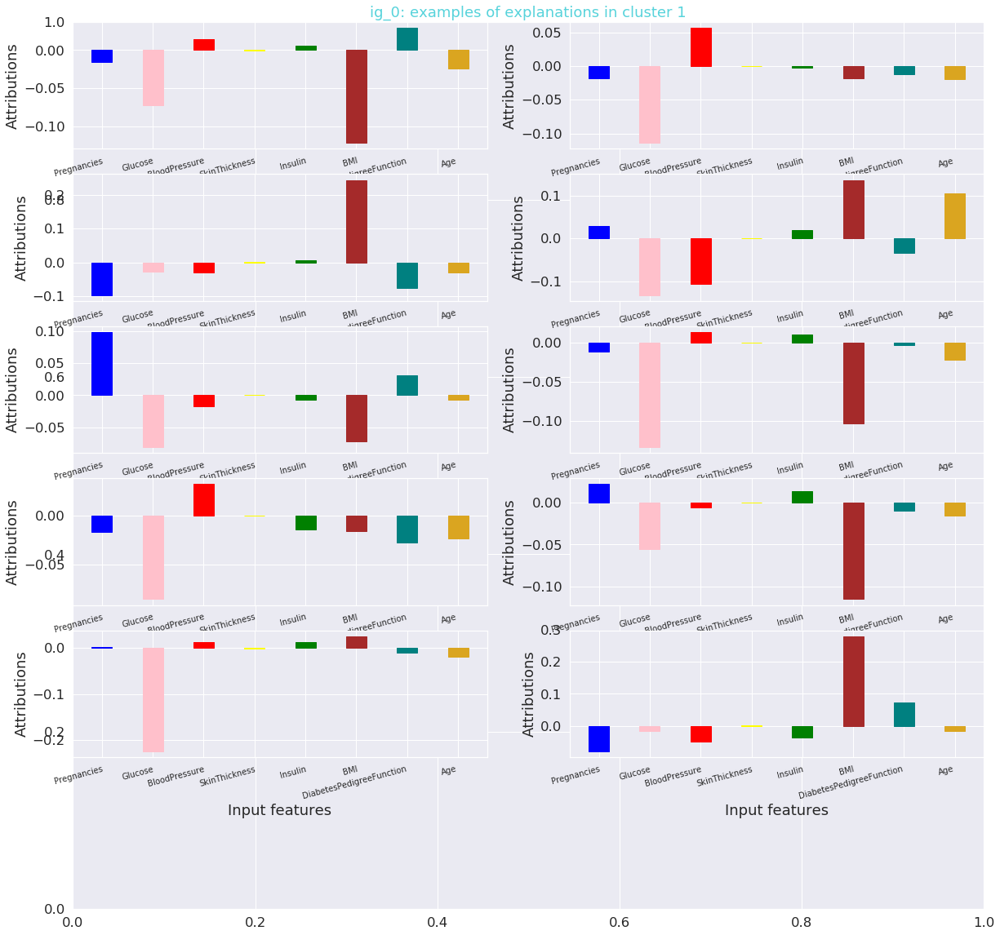

Imaginary values  [0.]


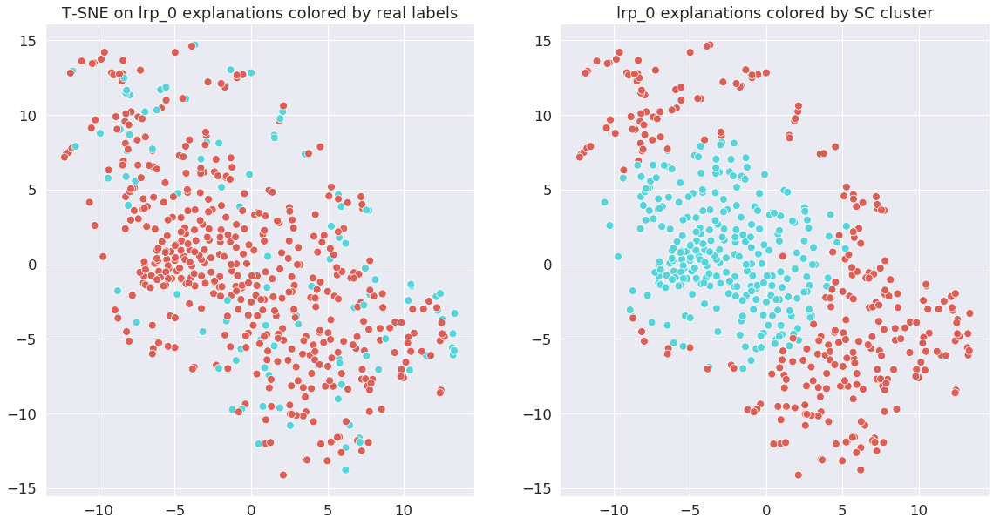

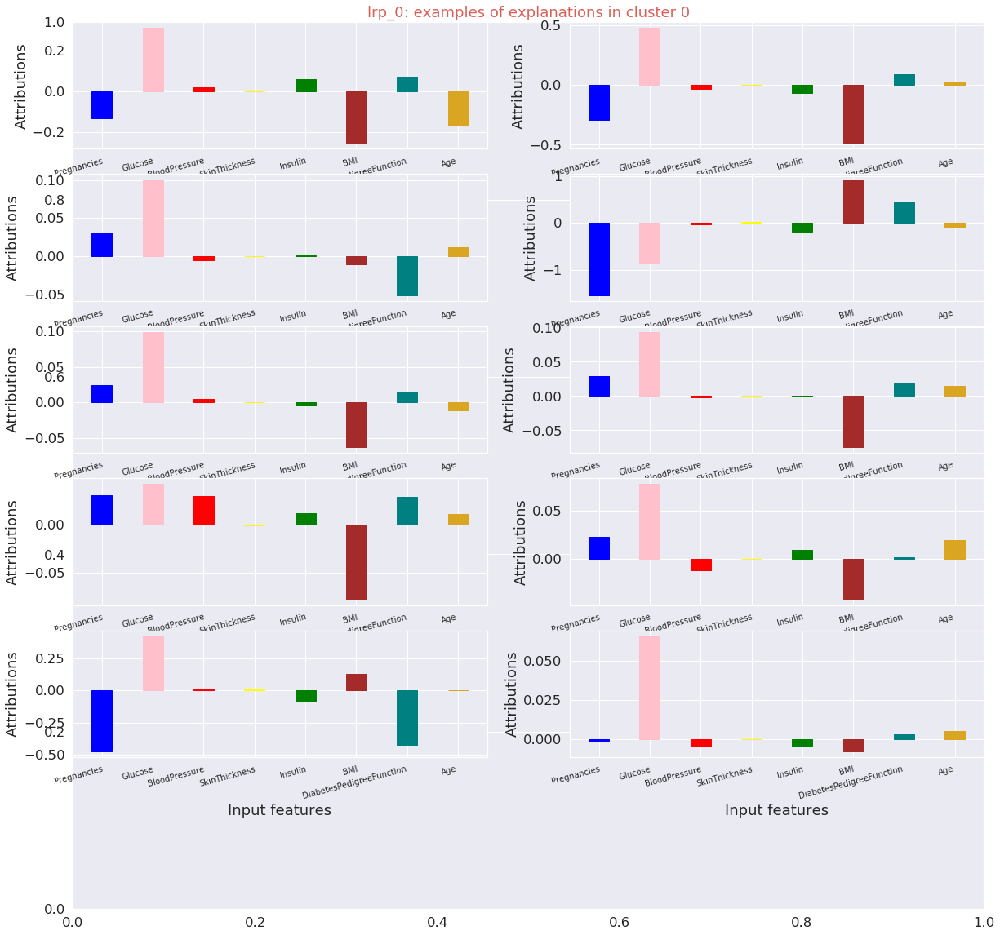

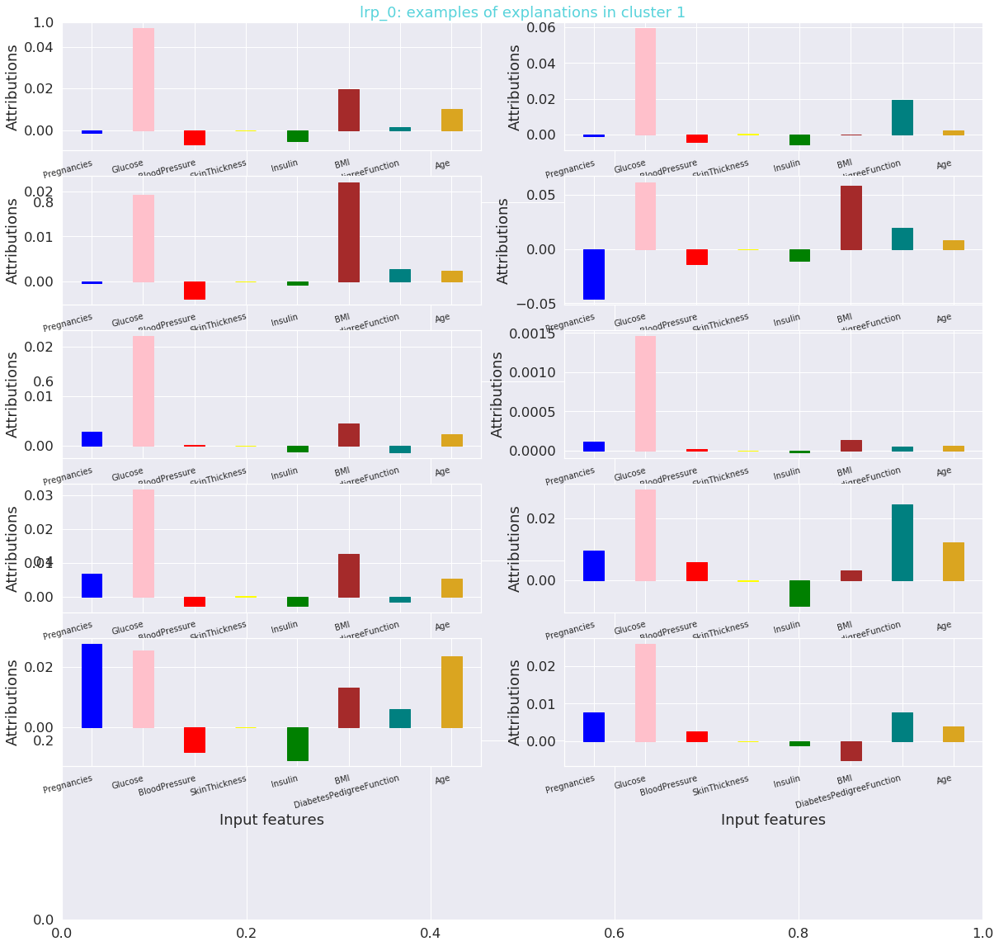

Imaginary values  [0.]


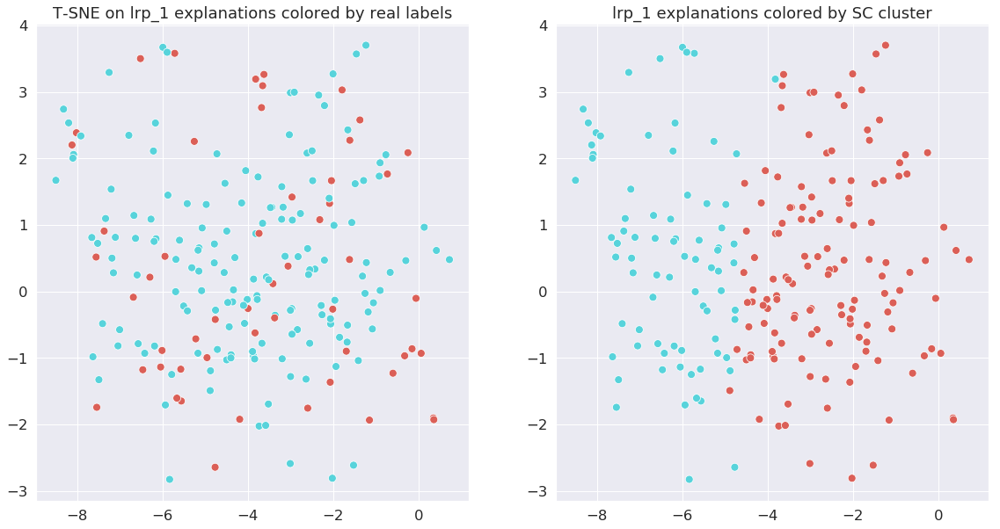

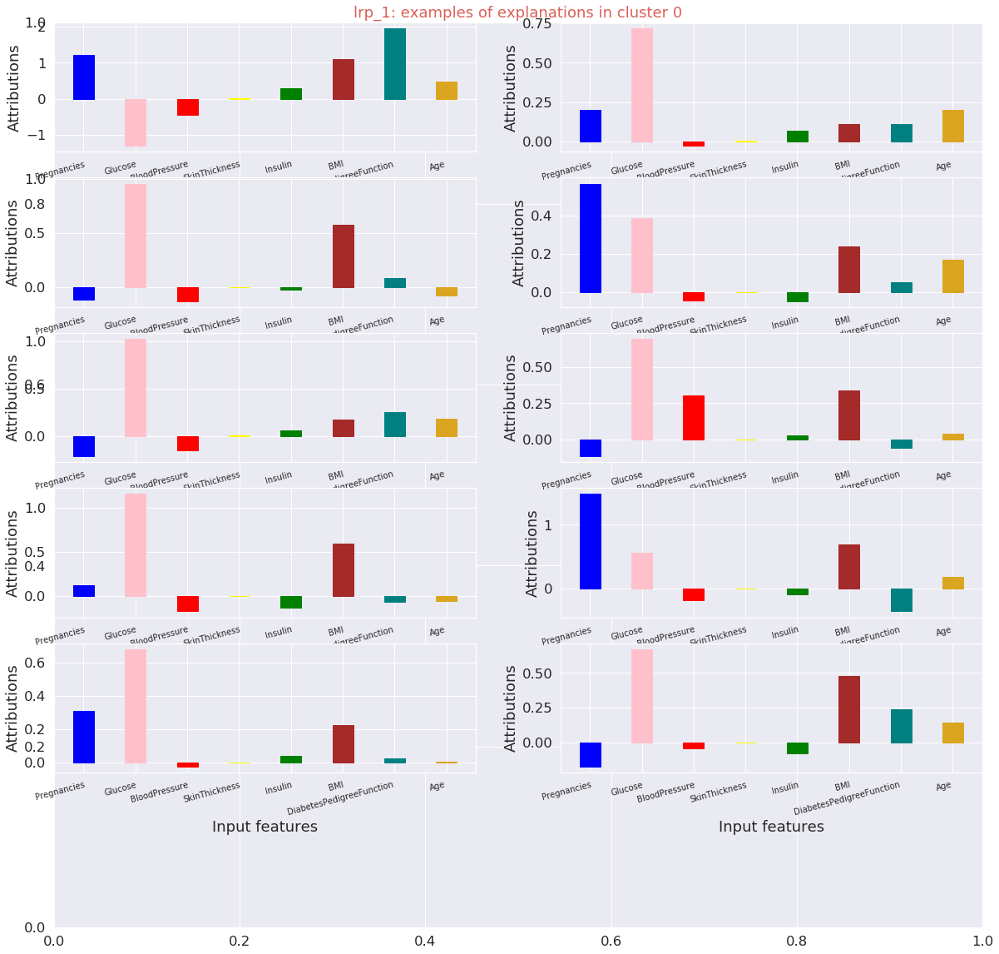

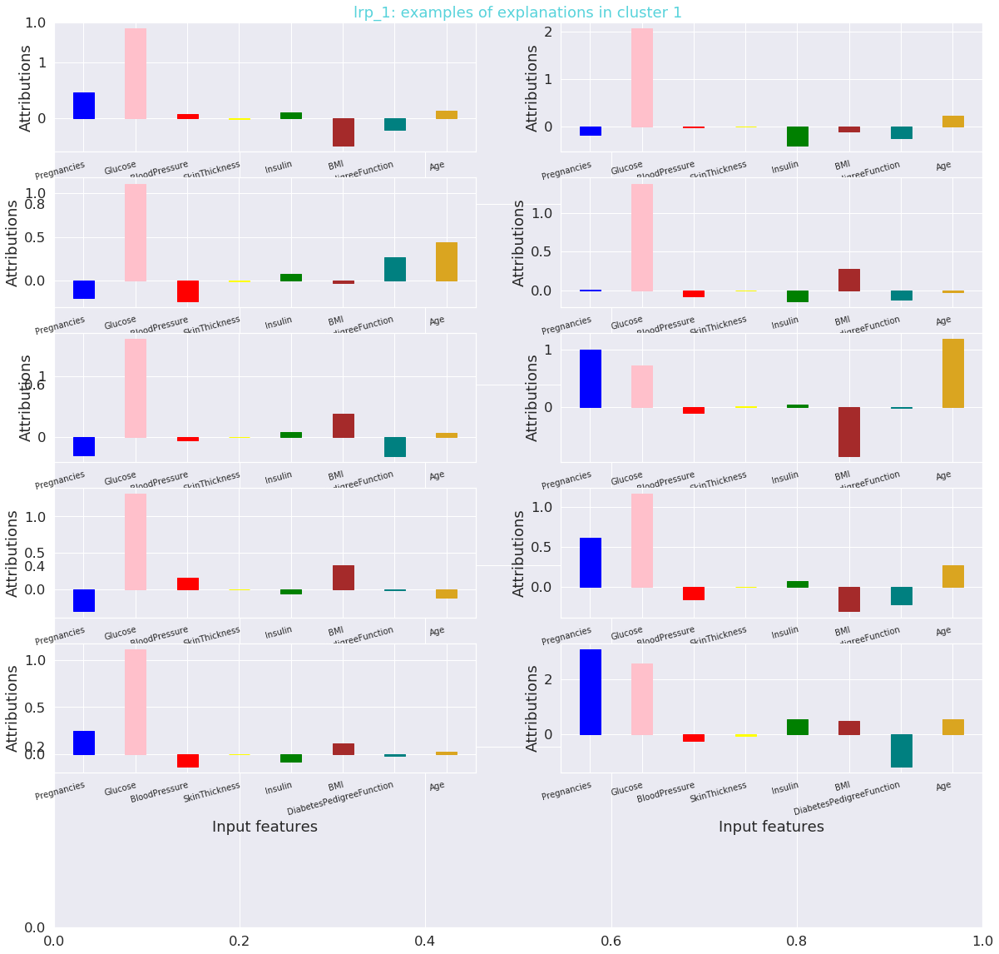

In [96]:
for method, (proy, mat, real_labels) in method_proy_attribution_labels.items():

    rows = 1
    cols = 2
    fig  = plt.figure(figsize = (30, 10))

    colors = clusters_to_colors(real_labels)
    add_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, 1, fig,
                                    "T-SNE on "+str(method)+" explanations colored by real labels")
    # Clustering
    n_clusters = method_class_perplexitys_clusters_dict[method][1]
    n_neighbors = method_class_nneighbors[method]
    clusters = clusters_by_spectral_clustering(mat, n_neighbors, n_clusters)

    # Clustering visualization
    colors = clusters_to_colors(clusters)
    add_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, 2, fig,
                                    method+" explanations colored by SC cluster")

    visualize_some_explanations_by_cluster(method, mat, clusters)